<a href="https://colab.research.google.com/github/MirandaCarou/Quantum_Algorithims_Programming/blob/main/benchmarking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install qiskit qiskit-aer pylatexenc
!pip install qiskit_ibm_runtime

# **Práctica de benchmarking con el circuito del algoritmo de Bernstein-Vazirani**

## **Introduction**

Developed in 1992 by Ethan Bernstein and Umesh Vazirani, the BV algorithm solves a problem known as the hidden shift problem, which has important applications in cryptography and error-correcting codes. In the hidden shift problem, we
are given a function $f(x)$ hat is guaranteed to have some hidden shift $a$, meanning that some unknown bit string exist such that $f(x) = f(a ⊕ x)$ for all inputs $x$. The goal of the hidden shift problem is to find the hidden shift $a$.

The BV algorithm uses the phase kickback technique o determine the n-bit hidden shift on a quantum computer using a black box function. In other words, given a function $f(x)$ that takesan n-bit string $x$ and returns a single bit, the algorithm aims to find the unknown n-but string $a$ that defines the function as:
$$
f(x) = a · x (mod 2)
$$

The intuition behind the Bernstein-Vazirani algorithm is to exploit the superposition and entanglement properties of quantum mechanics to efficiently determine the unknown string. The algorithm uses a quantum oracle that applies the function f (x) to a superposition of all possible inputs in parallel, and the resulting quantum state carries information about a. By measuring the quantum state, the algorithm can extract the bits of a one by one with high probability.

## **Bernstein-Vazirani Algorithm**

### **Motivation**

The Deutsch-Josza (DJ) algorithm ensures that a problem can be solved with certainty in polynomial time; the intuition behind the DJ algorithm is that for a balanced function, we know that half of the inputs output zero and the other half
output one. This is analogous to having two buckets, one with zeroes and the other with ones. If we query the oracle on a random set of points, that is, if we choose the inputs randomly, the probability of inputs coming from the same bucket reduces
exponentially. Classical computers can also solve the DJ algorithm in polynomial time if a negligible probability of wrong answers is allowed. However, in the BV algorithm, we define our problem in a way that quantum computers can solve with
a high probability but classical computers cannot solve it with a probability greater than half within the same amount of time.

### **Classical solution**

An n-bit input provides the output zero or one. Our guarantee in the Deutsch-Josza function was that it would either be a balanced function or a biased one; here, our function is guaranteed to be of a type $a · x$. This essentially means that we are given a string embedded in the oracle function, such that for any input given to the oracle function, the output is $a · x (mod2)$. The oracle will output the n-bit string a embedded in the function for any input.

Classically, we can perform n possible queries on the oracle where the inputs are in the sequence of $100 \dots 0$, $010 \dots 0$, all the way until $000 \dots 1$ (all possible n-bit strings). When these inputs are fed into the function $f(x) = a · x (mod2)$, one bit of the string $a$ is revealed with each query. The first query will give the first bit, the second query will give the second bit, and so on for n bits, after which the string is revealed.

Let us consider an example of this. We assume that the secret string embedded in the function, $a$, is $1101$. The oracle is going to be queried with $n = 4$ inputs then; the 1 in each input will move a place ahead, the bit-wise dot will determine what lies at each position,
$$
1000 · 1101 = 1 \\
$$
$$
0100 · 1101 = 1 \\
$$
$$
0010 · 1101 = 0 \\
$$
$$
0001 · 1101 = 1 \\
$$

revealing the full string, $a$, to be $1011$. Classically, we cannot do this in less than n calls. We can prove this lower bound. Assuming that we can find a solution by performing $n − 1$ queries, we can represent our oracle function using a system of $n − 1$ linear equations,
$$
f(x_1) = x_1a_1 + x_1a_2 + \dots +x_1a_n
$$
$$
f(x_2) = x_2a_1 + x_2a_2 + \dots +x_2a_n
$$
$$
\vdots
$$
$$
f(x_{n-1}) = x_{n-1}a_1 + x_{n-1}a_2 + \dots +x_{n-1}a_n
$$

Since the system has $n − 1$ equations and n variables, it is underdetermined, which means that there are less equations than there are variables. There is no unique solution to this system then. Therefore, we would need n queries as the minimum lower bound.

## **Quantum solution**

This circuit uses two important properties: quantum superposition and phase kickback. To use quantum superposition, we use Hadamard gates to generate multiple states that can query the oracle. We also add an ancillary qubit to the circuit so that for a n-bit query string we would require $n + 1$ qubits. The interaction between the query and ancillary bits is crucial to the algorithm. Phase kickback is used in such a way that while a controlled phase gate may be applied in such a way that the control is at the top qubit, the phase change also effects the top qubit.

### **Mathematical formulation**
We will begin by initializing all input qubits in the $|0\rangle$ state and the ancillary output qubit to $|-\rangle$ . Like all quantum algorithms, we then surrender our classical knowledge by passing our n qubit state |a\rangle through a series of Hadamard gates that act on all of the qubits. Multiple Hadamard gates are needed since a Hadamard gate is, by definition, a single-qubit gate. To evaluate the action of n Hadamard gates on $n$ qubits, let us first generalize the definition of the Hadamard gate without having to write its action on $|0\rangle$ and $|1\rangle$  separately. The action of the Hadamard gate on $|0\rangle$  and $|1\rangle$  is defined as,
$$
H|0\rangle = \frac{1}{\sqrt{2}}(|0\rangle + |1\rangle)
$$
$$
H|1\rangle = \frac{1}{\sqrt{2}}(|0\rangle - |1\rangle)
$$
which is just the case when $n = 1$. In order to generalize the action of the Hadamard gate for $n = 1$, that is, to write it as acting on some arbitrary one-qubit state $|a\rangle$, we make some observations. Firstly, a could either be 0 or 1 here. The coefficient of $|0\rangle$ is always 1, while that of $|1\rangle$ is either 1 or -1.
$$
H|0\rangle = \frac{1}{\sqrt{2}}((-1)^{0·0}|0\rangle + (-1)^{0·1}|1\rangle)
$$
where the dot product is between the number inside the state on which theHadamard gate is acting and that inside the ket corresponding to each coefficient. Similarly, we can write,
$$
H|1\rangle = \frac{1}{\sqrt{2}}((-1)^{1·0}|\rangle + (-1)^{1·1}|1\rangle)
$$
We can then express the action of the Hadamard gate on a single-qubit state $|a\rangle$ using summation notation as,
$$
H|a\rangle = \frac{1}{2}\sum_{x \in \{ 0,1\}^2}(-1)^{a·x}|x\rangle
$$
Since the action of a single Hadamard gate is truly just the action of a $2x2$ matrix on a single qubit state, we can use the Kronecker product to denote the action of multiple Hadamard gates. By following the same procedure as for the single qubit case, we can generalize the action of the Hadamard gate on a two-qubit state as well. The action of two Hadamard gates on a two-qubit state is just the product
of one Hadamard gate acting on the first qubit and the other acting on the second qubit. This is defined as,
$$
H^{\otimes 2}|00\rangle = \frac{1}{2}(|00\rangle + |01\rangle + |10\rangle + |11\rangle)
$$
$$
H^{\otimes 2}|01\rangle = \frac{1}{2}(|00\rangle - |01\rangle + |10\rangle - |11\rangle)
$$
$$
H^{\otimes 2}|10\rangle = \frac{1}{2}(|00\rangle + |01\rangle - |10\rangle - |11\rangle)
$$
$$
H^{\otimes 2}|11\rangle = \frac{1}{2}(|00\rangle - |01\rangle - |10\rangle + |11\rangle)
$$
Due to reasons stated above, we can write the left-hand side (LHS) as $H|0\rangle H|0\rangle$. We have already defined the action on a single-qubit state as $H|a\rangle$. For two qubits, we can then write,
$$
H^{\otimes n}|a\rangle = \frac{1}{\sqrt{2^n}}\sum_{x \in \{ 0,1\}^n}(-1)^{a·x}|x\rangle
$$
Now, in our algorithm, we initialize the upper register as $|0\rangle$, which is the same as $|000\dots 0\rangle$ or $0\rangle^{\otimes n}$. We first apply n Hadamard gates to this,
$$
H^{\otimes n}|0\rangle = \frac{1}{\sqrt{2^n}}\sum_{x \in \{ 0,1\}^n}|x\rangle
$$
where the $(−1)^{a·x}$ term disappears because $a = 0$, which makes the overall coefficient equal to $1$. The output is an equal superposition of all binary strings $|x\rangle$ of length $n$ in the first register. By preparing the equally weighted superposition of all possible values of $|x\rangle$ that can be stored in the first register, we open up the quantum interference. We now need to apply the quantum oracle to the outputs of the first n Hadamard gates. We have defined the oracle function $f(x)$ to be $0$ or $1$ and equal to $a · x$, where a is the secret string that we need to find and $x$ is the input. The phase oracle returns $1$ for any input
$x$ such that $a · x mod 2 = 1$ and returns $0$ otherwise.

We now use the same phase kickback logic that we did in the Deutsch-Josza algorithm where we considered the cases for when the function gave the outputs $0$ and $1$ to define the action of the oracle as,
$$
O_f |x\rangle  = (-1)^{a·x}|x\rangle
$$
in which the value of $a·x$ in the exponential (which is just how we defined our classical query function) determines whether the phase factor in front of |x\rangle is $+1$ or $-1$. Then the action of $O_f$ on the output is,
$$
O_f \left\{ \frac{1}{\sqrt{2^n}} \sum_{x \in \{0,1\}^n} |x\rangle \right\} = \frac{1}{\sqrt{2^n}} \sum_{x \in \{0,1\}^n} (-1)^{a\cdot x} |x\rangle
$$
We have the interference pattern now, which we need to close in order to make a measurement on our first register. The second set of Hadamard gates are then applied to the output from the oracle,
$$
H^{\otimes n}\frac{1}{\sqrt{2^{n}}}\sum_{x\in\{0,1\}^{n}}(-1)^{a\cdot x}|x\rangle=\frac{1}{\sqrt{2^{n}}}\sum_{x\in\{0,1\}^{n}}(-1)^{a\cdot x}H|x\rangle
$$
$$
=\frac{1}{2^n}\sum_{x,x'\in\{0,1\}^n}(-1)^{a\cdot x}(-1)^{x'\cdot x}|x'\rangle
$$
$$
=\frac{1}{2^n}\sum_{x,x'\in\{0,1\}^n}(-1)^{a\cdot x}(-1)^{x'\cdot x}|x'\rangle
$$
$$
=\frac{1}{2^n}\sum_{x'\in \{0,1\}^n}\left\{\sum_{x\in \{0,1\}^n}(-1)^{(x' \oplus a)\cdot x}\right\} |x' \rangle.
$$
The exponential of the boldface term inside the curly brackets is just a bit-wise addition. We can consider the boldface term case-wise. If $a = x′$, that is, if a and $x′$ are two identical binary strings, the bit-wise addition of two identical binary strings would result in a binary string comprising of zeroes only. That would mean that the exponential would be equal to zero, meaning that the phase factor with $|x′⟩$ would be $+1$. The expression is being added $2n$ times, so the boldface term inside the bracket would just be equal to $2n$. The overall output would then just be $|a\rangle$. Summarising the first case where $a = x′$, which implies $a ⊕ y = 0$,
$$
= \frac{1}{2^n} \sum_{x' \in \{0, 1\}^n} \left\{ \sum_{x \in \{0, 1\}^n} (-1)^{0 \cdot x} \right\} |x'\rangle
$$
$$
= \frac{1}{2^n} \sum_{x' \in \{0, 1\}^n} \left\{ 2^n \right\} |x'\rangle = |a\rangle.
$$
On the other hand, if a is not equal to $x′$, the bit-wise addition of $a$ and $x$ would be a binary string that would not be equal to zero; there will be at least one $1$ in the string. When we run the sum through all possible values of the binary string $x$ or when we take the dot product, an equal number of zeroes and ones is generated, which would mean that the sum of the phase factor would have an equal number of zeroes and ones. This makes sense because if we get $x′ = a$ at the output with probability $1$, the probability of all other possible outcomes should be zero. The output then gives us the value of a with certainty.

From there on, one only has to perform a bit-by-bit measurement on the register in order to read the binary values of a.

## **Complexity**

The factor that allows this algorithm its distinguished position can only be understood once we talk about complexity. To define complexity for quantum algorithmsand to be able to compare it to the complexity of classical computation complexity theory defines two important classes: **BPP** and **BQP**. **BPP^** stands for Bounded-error Probabilistic Polynomial time, this class is reserved for problems that can be solved with a certain probability, usually $\frac{1}{3}$ , in polynomial time. This class defines the set of problems that can easily be solved by a classical probabilistic computer. BQP stands for Bounded-error Quantum Polynomial time and defines the class of problems that can be solved by a quantum computer. The **Bernstein-Vazirani algorithm** was one of the earlier algorithms to make a distinction between these two classes and show that quantum algorithms have an advantage over the classical algorithm.

We can analyse the circuit in a myriad of ways. The most common way to discuss the complexity of a quantum algorithm is query complexity, which is the amount of times we need to query the oracle to guess the string. As discussed in previous sections, for the **BV algorithm** the query complexity is $0(1)$, where the classical algorithm requires $O(n)$. Another criteria we can look at is the circuit complexity, which is the number of gates required to implement the Oracle. In our case, the worst case is that the string consist entirely of 1s, which leads to a complexity of $O(n)$.

Additionally, we can look at time complexity. Traditionally this is defines as the time taken for the algorithm to execute as a function of it’s length. For a quantum algorithm if we assume that all the gates at the same depth can be executed in parallel we can then define the time complexity in terms of the depth of the circuit. For our case we have a depth of $3$ due to the application of the Hadamard gates at the beginning and end, and the **Pauli-Z gate** for the auxiliary qubit. In addition to this we can have $n$ gates in the oracle, leading to a time complexity of $O(n + 3)$.

Finally, we can look at the space complexity. Space complexity classes are related to the amount of space taken by quantum and classical Turing machines and measured in terms of number of bits required to encode information. Generally, we can say that at most the space required for a given configuration is bounded by $2^l$ where $l$ is the length of the binary string we are encoding. In this case, we have $n + 1$ bits for a $n$ bit string hence the space complexity can be expressed as $O(2n+1)$.

# **Benchmarking project summary**

| Section           | Question                                                                 | Answer |
|-------------------|--------------------------------------------------------------------------|--------|
| **1. Benchmark Design** | What is the real-world application being targeted? | Evaluation of simulator and fake backend performance for the Bernstein–Vazirani algorithm |
| | What is the computational kernel used? | Bernstein–Vazirani circuit with custom oracle in Qiskit |
| | What is the synthetic circuit design strategy? | Varying the secret bitstring `s` with increasing `n` (qubits), composing oracle + Hadamard layers |
| **2. Reproducibility** | How is the benchmark executed systematically? | Automated loop over qubit sizes and backends; fixed shots; optimization levels 0–3 for fake backends tests |
| | What elements of the software stack are recorded? | Qiskit/Python versions, simulator method and backend names |
| | How is randomness controlled? | Deterministic `s` generation; no noise/random gates affecting core algorithm |
| **3. Metrics** | What metric evaluates execution speed? | Total execution time (`time.time()` around simulator run) |
| | What metric evaluates output accuracy? | Success probability (frequency of measuring correct `s`) |
| | How are metrics stored? | Python lists/dictionaries during execution; exportable to pandas/CSV |
| **4. Evaluation** | Which QPUs/backends were tested? | All AerSimulator methods + almost all FakeProviders|
| | Qubit count range tested? | 2-100 qubits(+-) (simulators)<br>2–10 qubits (fake backends: 14q to 127q devices) |
| | Key performance trends observed? | • Simulators: 100% success rate<br>• Fake backends: Better performance with bigger fake backends (especially Level 2 of optimization) |
| | How are results presented? | Console output + plots (execution time/success rate); cross-device comparisons |


In [ ]:
import qiskit
import qiskit_aer
import pylatexenc
import qiskit_ibm_runtime
import sys

print("Qiskit version:", qiskit.__version__)
print("Qiskit Aer version:", qiskit_aer.__version__)
print("Pylatexenc version:", pylatexenc.__version__)
print("Qiskit IBM Runtime version:", qiskit_ibm_runtime.__version__)
print("Python version:", sys.version)

Qiskit version: 2.0.2
Qiskit Aer version: 0.17.0
Pylatexenc version: 2.10
Qiskit IBM Runtime version: 0.40.0
Python version: 3.12.4 | packaged by Anaconda, Inc. | (main, Jun 18 2024, 15:03:56) [MSC v.1929 64 bit (AMD64)]


**My own computer specifications**

| Specification                | Details                                                                 |
|------------------------------|-------------------------------------------------------------------------|
| **Device Name**              | DESKTOP-NL9J1CJ                                                        |
| **Processor**                | AMD Ryzen 7 4800H with Radeon Graphics @ 2.90 GHz                      |
| **Installed RAM**            | 16.0 GB (15.4 GB usable)                                               |
| **Device ID**                | 0C8EC9CA-0351-481A-BCDB-608BA4150139                                   |
| **Product ID**               | 00330-80000-00000-AA770                                                |
| **System Type**              | 64-bit operating system, x64-based processor                           |
| **Pen and Touch**            | Touch or pen input is not available for this display                   |

## **Basic example to show trivial behaviour of tested circuit**


In [ ]:
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister, transpile
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import numpy as np
from math import sqrt
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister, transpile
from qiskit.quantum_info import Statevector
from qiskit_aer import AerSimulator
from qiskit.visualization import plot_histogram
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
def obten_estado(qcirc, etiqueta="|\psi> = ", bloch=False):
    sim = AerSimulator(method='statevector')
    qc_obj = transpile(qcirc, sim)
    result = sim.run(qc_obj).result()
    estado = result.get_statevector()
    display(estado.draw('latex', prefix=etiqueta))
    if bloch:
      display(estado.draw('bloch'))

def obten_unitaria(qcirc, etiqueta):
    sim_u = AerSimulator(method='unitary')
    qc_obj = transpile(qcirc, sim_u)
    result = sim_u.run(qcirc).result()
    unitary = result.get_unitary(qcirc)
    display(unitary.draw('latex', prefix=etiqueta))

# Obtenemos s como una lista de valores binarios aleatoria
def get_s(n):
    s = list()
    for q in range(n):
        if np.random.randint(2) == 1:
            s.append(1)
        else:
            s.append(0)
    return(s)

def bv_oraculo(n):
    x = QuantumRegister(n, name="|x\\rangle")
    y = QuantumRegister(1, name="|y\\rangle")
    qc = QuantumCircuit(x,y)
    s = get_s(n)
    print(s)
    sinv = s[::-1] # Invertimos s para recorrerlo del bit menos al más significativo

    for p in range(n):
      if sinv[p] == 1:
        qc.cx(x[p],y)

    # Salida
    oraculo = qc.to_gate()
    oraculo.name = "$U_{bernstein}$"
    return oraculo

def algoritmo_bernstein_Vazirani(n):
    qc = QuantumCircuit(n+1,n)
    qc.x(n)
    qc.barrier()

    qc.h(range(n))
    qc.h(n)

    qc = qc.compose(bv_oraculo(n))
    qc.barrier()

    qc.h(range(n))
    qc.measure(range(n), range(n))

    return qc

[0, 0, 0, 1]


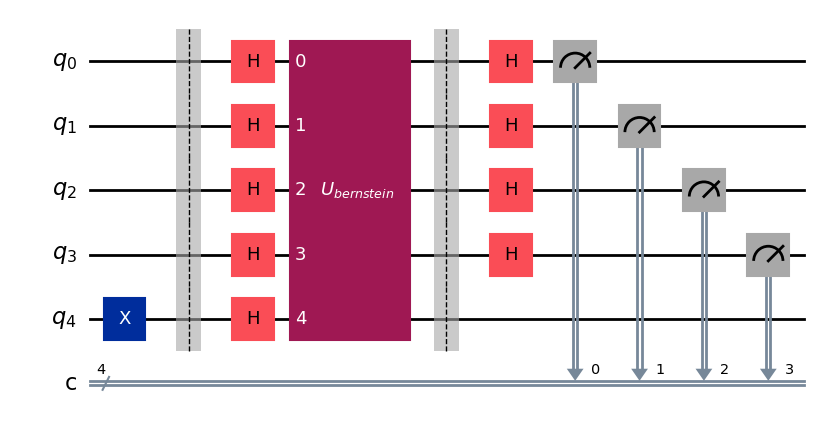

In [ ]:
tipo_oraculo = 0
bv_circuito = algoritmo_bernstein_Vazirani(4)
bv_circuito.draw('mpl')

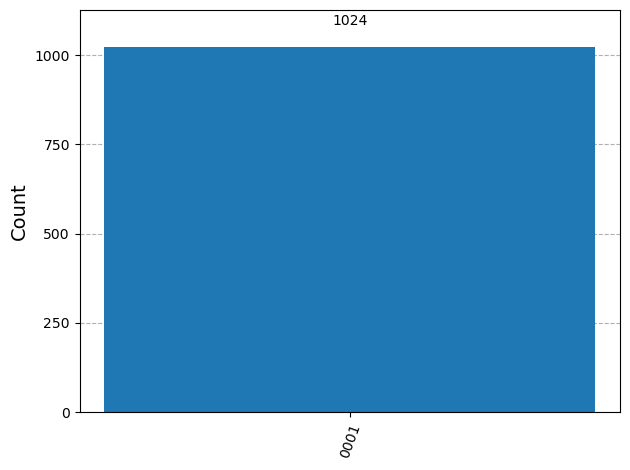

In [ ]:
sim = AerSimulator(method='automatic')
qc_obj = transpile(bv_circuito, sim)
result = sim.run(qc_obj, shots=1024).result()
salida = result.get_counts()
plot_histogram(salida)

# **Benchmarking**

## **Testing different types of simulators**

**AerSimulator** is a noisy quantum circuit simulator backend which supports multiple simulation methods and configurable options for each simulation method. These may be set using appropiate kwargs during initialization. The simulation method is set using the method kwarg. A list supported simulation methods can be returned using `available_methods()`, these are

- `automatic`: Default simulation method. Select the simulation method automatically based on the circuit and noise model.

- `statevector`: A dense statevector simulation that can sample measurement outcomes from ideal circuits with all measurements at end of the circuit. For noisy simulations each shot samples a randomly sampled noisy circuit from the noise model.

- `density_matrix`: A dense density matrix simulation that may sample measurement outcomes from noisy circuits with all measurements at end of the circuit.

- `stabilizer`: An efficient Clifford stabilizer state simulator that can simulate noisy Clifford circuits if all errors in the noise model are also Clifford errors.

- `extended_stabilizer`: An approximate simulated for Clifford + T circuits based on a state decomposition into ranked-stabilizer state. The number of terms grows with the number of non-Clifford (T) gates.

- `matrix_product_state`: A tensor-network statevector simulator that uses a Matrix Product State (MPS) representation for the state. This can be done either with or without truncation of the MPS bond dimensions depending on the simulator options. The default behaviour is no truncation.

- `unitary`: A dense unitary matrix simulation of an ideal circuit. This simulates the unitary matrix of the circuit itself rather than the evolution of an initial quantum state. This method can only simulate gates, it does not support measurement, reset, or noise.

- `superop`: A dense superoperator matrix simulation of an ideal or noisy circuit. This simulates the superoperator matrix of the circuit itself rather than the evolution of an initial quantum state. This method can simulate ideal and noisy gates, and reset, but does not support measurement.

- `tensor_network`: A tensor-network based simulation that supports both statevector and density matrix. Currently there is only available for GPU and accelerated by using cuTensorNet APIs of cuQuantum.


In [ ]:
import time
from qiskit.quantum_info import Statevector
from qiskit.result import Counts
from qiskit.visualization import plot_histogram

def ejecutar_benchmark(qc, method, shots=1024):
    sim = AerSimulator(method=method)
    qc_obj = transpile(qc, sim)

    inicio = time.time()
    result = sim.run(qc_obj, shots=shots).result()
    fin = time.time()

    tiempo = fin - inicio
    counts = result.get_counts()

    return counts, tiempo

def calcular_tasa_exito(counts, s_bin):
    total = sum(counts.values())
    exito = counts.get(s_bin, 0)
    return exito / total

def correr_caso_benchmark(n, method, shots=1024, verbose=False):
    s = get_s(n)
    s_bin = ''.join(map(str, s))

    if verbose:
        print(f"Cadena secreta (s): {s_bin}")

    # Generar circuito
    circuito = QuantumCircuit(n+1, n)
    circuito.x(n)
    circuito.h(range(n+1))
    circuito = circuito.compose(bv_oraculo_personalizado(s))
    circuito.barrier()
    circuito.h(range(n))
    circuito.measure(range(n), range(n))

    # Ejecutar y medir
    counts, tiempo = ejecutar_benchmark(circuito, method, shots=shots)
    tasa_exito = calcular_tasa_exito(counts, s_bin)

    if verbose:
        print(f"Tiempo de ejecución: {tiempo:.4f} s")
        print(f"Tasa de éxito: {tasa_exito:.4f}")

    return {
        "n": n,
        "s": s_bin,
        "tiempo": tiempo,
        "tasa_exito": tasa_exito,
        "counts": counts
    }

def bv_oraculo_personalizado(s):
    n = len(s)
    x = QuantumRegister(n, name="|x⟩")
    y = QuantumRegister(1, name="|y⟩")
    qc = QuantumCircuit(x, y)

    sinv = s[::-1]
    for p in range(n):
        if sinv[p] == 1:
            qc.cx(x[p], y)

    oraculo = qc.to_gate()
    oraculo.name = "$U_{bernstein}$"
    return oraculo


### `Aersimulator(method='automatic')`

In [ ]:
resultados = []
for n in range(2, 29):
    resultado = correr_caso_benchmark(n, 'automatic')
    resultados.append(resultado)


I couldn't achieve a test wit `n=30` because :

❗`CircuitTooWideForTarget: 'Number of qubits (30) in circuit-750 is greater than maximum (29) in the coupling_map'`❗

In [ ]:
df_automatic = pd.DataFrame(resultados)

df_automatic

,n,s,tiempo,tasa_exito,counts
0,2,10,0.005001,1.0,{'10': 1024}
1,3,100,0.003985,1.0,{'100': 1024}
2,4,1001,0.004004,1.0,{'1001': 1024}
3,5,01101,0.002997,1.0,{'01101': 1024}
4,6,001101,0.003512,1.0,{'001101': 1024}
5,7,0010010,0.003001,1.0,{'0010010': 1024}
6,8,01001001,0.004006,1.0,{'01001001': 1024}
7,9,101100000,0.027175,1.0,{'101100000': 1024}
8,10,0101011011,0.003982,1.0,{'0101011011': 1024}
9,11,10101100111,0.006001,1.0,{'10101100111': 1024}


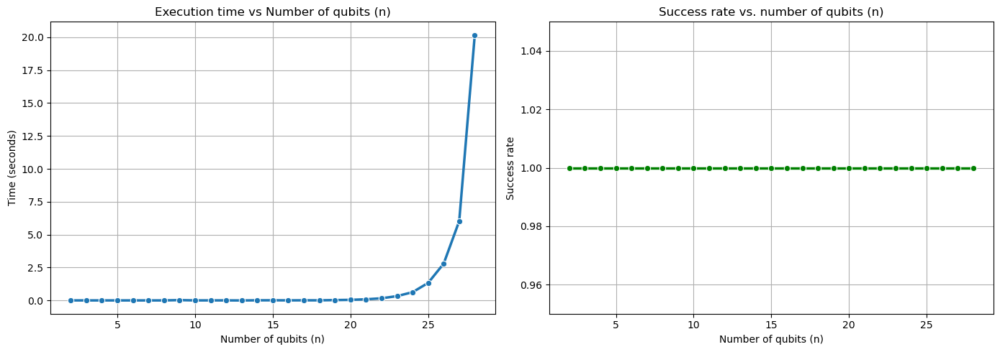

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_automatic, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_automatic_aersimulator.png")
plt.show()

### `Aersimulator(method='statevector')`

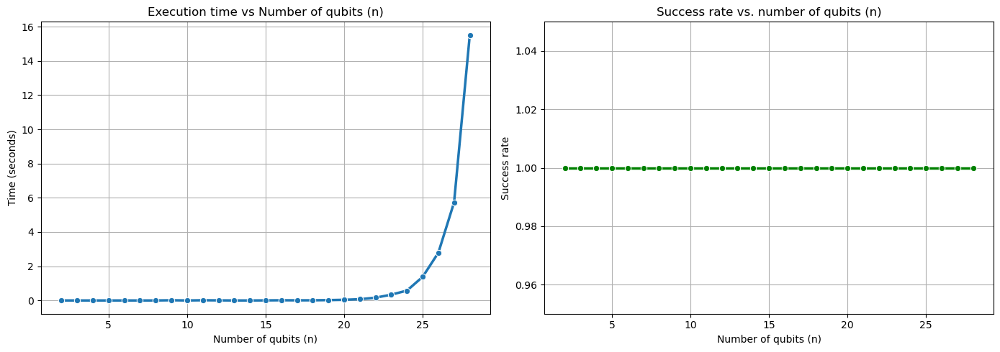

In [ ]:
resultados = []
for n in range(2, 29):
    resultado = correr_caso_benchmark(n, 'statevector')
    resultados.append(resultado)

df_state_vector = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_state_vector, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_state_vector, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_statevector_aersimulator.png")
plt.show()

I don't see neccesary to check for more qubits because its obvius that the execution time grows exponetially

### `Aersimulator(method='density_matrix')`

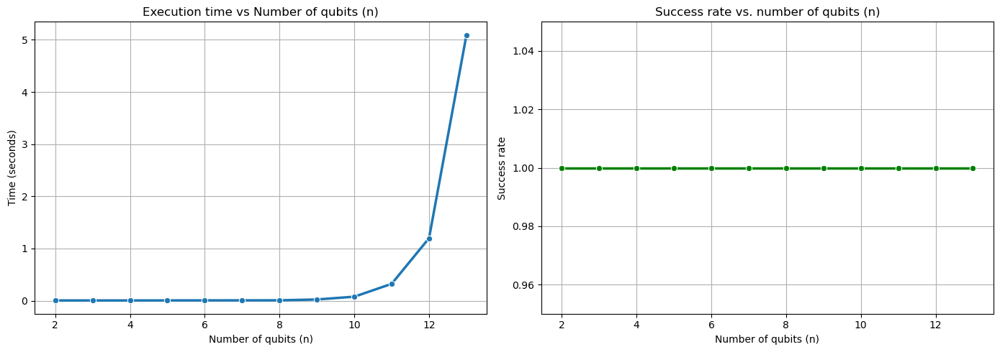

In [ ]:
resultados = []
for n in range(2, 14):
    resultado = correr_caso_benchmark(n, 'density_matrix')
    resultados.append(resultado)

df_density_matrix = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_density_matrix, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_density_matrix, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_density_matrix_aersimulator.png")
plt.show()

I couldn't achieve a test wit n=15 because :

❗`CircuitTooWideForTarget: 'Number of qubits (15) in circuit-1602 is greater than maximum (14) in the coupling_map'`❗

### `Aersimulator(method='stabilizer')`

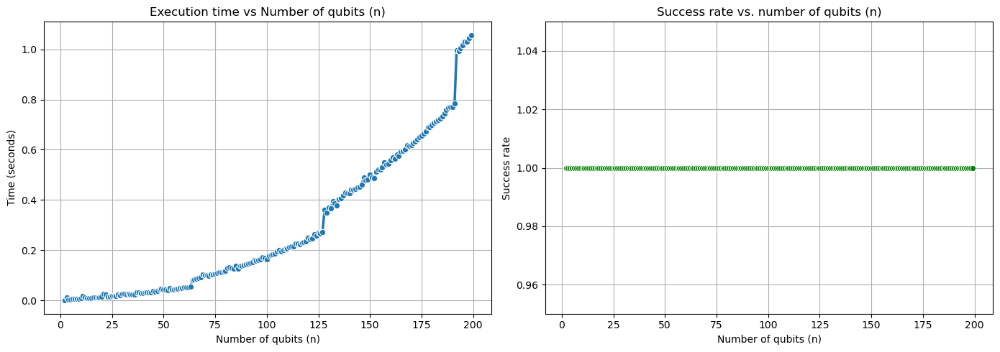

In [ ]:
resultados = []
for n in range(2, 200):
    resultado = correr_caso_benchmark(n, 'stabilizer')
    resultados.append(resultado)

df_stabilizer = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_stabilizer, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_stabilizer, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_stabilizer_aersimulator.png")
plt.show()

### `Aersimulator(method='extended_stabilizer')`

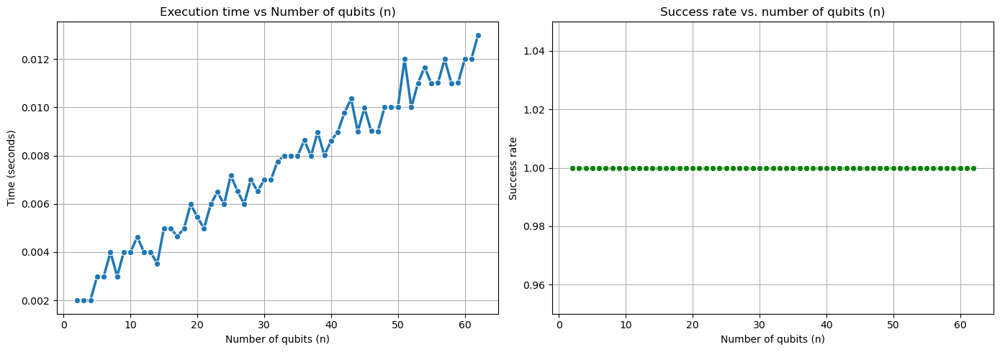

In [ ]:
resultados = []
for n in range(2, 63):
    resultado = correr_caso_benchmark(n, 'extended_stabilizer')
    resultados.append(resultado)

df_extended_stabilizer = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_extended_stabilizer, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_extended_stabilizer, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_extended_stabilizer_aersimulator.png")
plt.show()

I couldn't achieve a test with `n=64` because :

❗`CircuitTooWideForTarget: Number of qubits (64) in circuit-2571 is greater than maximum (63) in the coupling_map`❗

### `Aersimulator(method='matrix_product_state')`

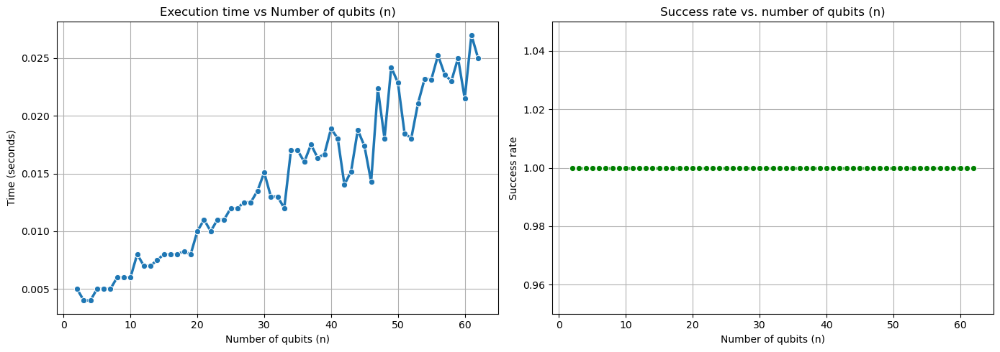

In [ ]:
resultados = []
for n in range(2, 63):
    resultado = correr_caso_benchmark(n, 'matrix_product_state')
    resultados.append(resultado)

df_matrix_product_state = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_matrix_product_state, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_matrix_product_state, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_matrix_product_state_aersimulator.png")
plt.show()

I couldn't achieve a test with `n=64` because :

❗`CircuitTooWideForTarget: 'Number of qubits (64) in circuit-9068 is greater than maximum (63) in the coupling_map'`❗

### `Aersimulator(method='unitary')`

In [ ]:
resultados = []
for n in range(2, 3):
    resultado = correr_caso_benchmark(n, 'unitary')
    resultados.append(resultado)

df_unitary = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_unitary, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_unitary, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_unitary_aersimulator.png")
plt.show()



❗`QiskitError: 'ERROR:  [Experiment 0] Circuit circuit-9377 contains invalid instructions {"instructions": {measure}} for "unitary" method.Circuit circuit-9377 contains invalid parameters  for "unitary" method. ,  ERROR: Circuit circuit-9377 contains invalid instructions {"instructions": {measure}} for "unitary" method.Circuit circuit-9377 contains invalid parameters  for "unitary" method.'`❗

### `Aersimulator(method='superop')`

In [ ]:
resultados = []
for n in range(2, 3):
    resultado = correr_caso_benchmark(n, 'superop')
    resultados.append(resultado)

df_superop = pd.DataFrame(resultados)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
sns.lineplot(data=df_superop, x="n", y="tiempo", marker="o", linewidth=2.5)
plt.title("Execution time vs Number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

plt.subplot(1, 2, 2)  #
sns.lineplot(data=df_superop, x="n", y="tasa_exito", marker="o", linewidth=2.5, color="green")
plt.title("Success rate vs. number of qubits (n)")
plt.xlabel("Number of qubits (n)")
plt.ylabel("Success rate")
plt.ylim(0.95, 1.05)
plt.grid(True)

plt.tight_layout()
plt.savefig("graficos_comparados_superop_aersimulator.png")
plt.show()

❗`QiskitError: 'ERROR:  [Experiment 0] Circuit circuit-9387 contains invalid instructions {"instructions": {measure}} for "superop" method.Circuit circuit-9387 contains invalid parameters  for "superop" method. ,  ERROR: Circuit circuit-9387 contains invalid instructions {"instructions": {measure}} for "superop" method.Circuit circuit-9387 contains invalid parameters  for "superop" method.'`❗

### `Aersimulator(method='tensor_network')`

This options it's only to use with GPU and doesn't work in CPU

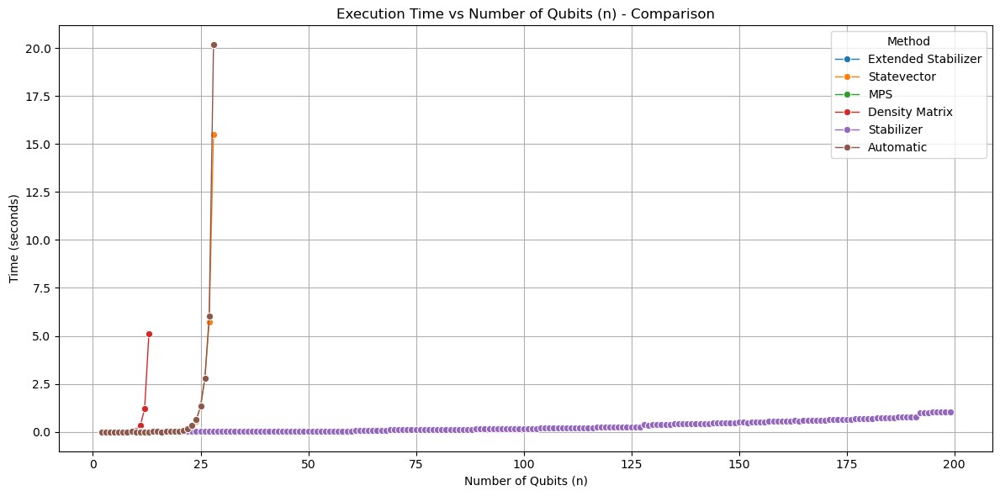

In [ ]:
dfs = {
    'Extended Stabilizer': df_extended_stabilizer,
    'Statevector': df_state_vector,
    'MPS': df_matrix_product_state,
    'Density Matrix': df_density_matrix,
    'Stabilizer': df_stabilizer,
    'Automatic': df_automatic
}

plt.figure(figsize=(12, 6))
plt.title("Execution Time vs Number of Qubits (n) - Comparison")
plt.xlabel("Number of Qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

# Graficar cada DataFrame
for label, df in dfs.items():
    sns.lineplot(data=df, x="n", y="tiempo", marker="o", label=label, linewidth=1)

plt.legend(title="Method")
plt.tight_layout()
plt.savefig("comparacion_tiempos.png")
plt.show()

If we plot the results without the stabilizer method results we could examine better the results

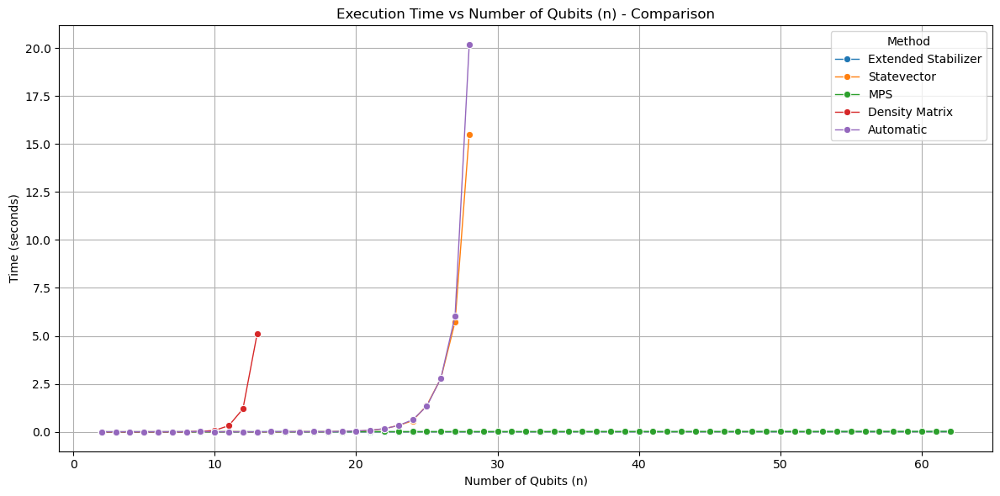

In [ ]:
dfs = {
    'Extended Stabilizer': df_extended_stabilizer,
    'Statevector': df_state_vector,
    'MPS': df_matrix_product_state,
    'Density Matrix': df_density_matrix,
    'Automatic': df_automatic
}

plt.figure(figsize=(12, 6))
plt.title("Execution Time vs Number of Qubits (n) - Comparison")
plt.xlabel("Number of Qubits (n)")
plt.ylabel("Time (seconds)")
plt.grid(True)

# Graficar cada DataFrame
for label, df in dfs.items():
    sns.lineplot(data=df, x="n", y="tiempo", marker="o", label=label, linewidth=1)

plt.legend(title="Method")
plt.tight_layout()
plt.savefig("comparacion_tiempos_sin_stabilizer.png")
plt.show()

It's quite strange for me because theoretically the `method='atomatic'` must choose always the best options. So, ¿Why didnt use the `stabilizar method` for more than 64 qubits? Searching I found that the stabilizar simulation method efficiently simulates Clifford circuits, which use only, Hadamard gates, Phase gates, CNOT gates and measurements. Also, can simulate hundreds or thousands of qubits efficiently due to the formation of a restricted subset of all quantum operations by Clifford gates. Even our algorithim looks simple, maybe the `compose()`  encapsulated the oracle in a generic gate and the transpiler cant look inside this gate. Even though I´m not compleatly sure. Maybe this i something to take into consideration in future implementations. I´m going to try changing the `compose()` for the `append()`

In [ ]:
def correr_caso_benchmark(n, method, shots=1024, verbose=False):
    s = get_s(n)
    s_bin = ''.join(map(str, s))

    if verbose:
        print(f"Cadena secreta (s): {s_bin}")

    # Generar circuito
    circuito = QuantumCircuit(n+1, n)
    circuito.x(n)
    circuito.h(range(n+1))
    circuito.append(bv_oraculo_personalizado(s), circuito.qubits)
    circuito.barrier()
    circuito.h(range(n))
    circuito.measure(range(n), range(n))

    # Ejecutar y medir
    counts, tiempo = ejecutar_benchmark(circuito, method, shots=shots)
    tasa_exito = calcular_tasa_exito(counts, s_bin)

    if verbose:
        print(f"Tiempo de ejecución: {tiempo:.4f} s")
        print(f"Tasa de éxito: {tasa_exito:.4f}")

    return {
        "n": n,
        "s": s_bin,
        "tiempo": tiempo,
        "tasa_exito": tasa_exito,
        "counts": counts
    }

resultados = []
for n in range(2, 100):
    resultado = correr_caso_benchmark(n, 'automatic')
    resultados.append(resultado)

`CircuitTooWideForTarget: 'Number of qubits (30) in circuit-83185 is greater than maximum (29) in the coupling_map'`

I can't figure out what's happening right now, and it's not the purpose of this work, but time has shown me that sometimes not trusting Qiskit is the better option.

## **Testing with different Fake Providers**

The fake provider module contains fake providers and fake backends classes. The fake backends are built to mimic the behaviors of IBM Quantum systems using system snapshots. The system snapshots contain important information about the quantum system such as coupling map, basis gates, qubit properties (T1, T2, error rate, etc.) which are useful for testing the transpiler and performing noisy simulations of the system.

Recall that the simulation is done using a **noise model** generated from system snapshots obtained in the past (sometimes a few years ago) and the results are not representative of the latest behaviors of the real quantum system that the fake backend is mimicking. If we want to run noisy simulations with the latest backend snapshots, we must use the `refresh()` method. We could try both cases

**Fake V2 backends** are fake backends with IBM Quantum systems snapshots implemented with **BackendV2** interface. They are all subclasses of **FakeBackendV2**.

| Number of qubits | Backend name                           | Notes                                      |
|------------------|----------------------------------------|--------------------------------------------|
| 1                | FakeArmonkV2                           |                                            |
| 5                | FakeAthensV2                           |                                            |
| 5                | FakeBelemV2                            |                                            |
| 5                | FakeBogotaV2                           |                                            |
| 5                | FakeBurlingtonV2                       |                                            |
| 5                | FakeEssexV2                            |                                            |
| 5                | FakeLimaV2                             |                                            |
| 5                | FakeFractionalBackend                  | Basedin FakeLima                           |
| 5                | FakeLondonV2                           |                                            |
| 5                | FakeManilaV2                           |                                            |
| 5                | FakeOurenseV2                          |                                            |
| 5                | FakeQuitoV2                            |                                            |
| 5                | FakeRomeV2                             |                                            |
| 5                | FakeValenciaV2                         |                                            |
| 5                | FakeVigoV2                             |                                            |
| 5                | FakeYorktownV2                         |                                            |
| 7                | FakeCasablancaV2                       |                                            |
| 7                | FakeJakartaV2                          |                                            |
| 7                | FakeLagosV2                            |                                            |
| 7                | FakeNairobiV2                          |                                            |
| 7                | FakeOslo                               |                                            |
| 7                | FakePerth                              |                                            |
| 14               | FakeMelbourneV2                        |                                            |
| 16               | FakeGuadalupeV2                        |                                            |
| 27               | FakeAlgiers                            |                                            |
| 27               | FakeAuckland                           |                                            |
| 27               | FakeCairoV2                            |                                            |
| 27               | FakeGeneva                             |                                            |
| 27               | FakeHanoiV2                            |                                            |
| 27               | FakeKolkataV2                          |                                            |
| 27               | FakeMontrealV2                         |                                            |
| 27               | FakeMumbaiV2                           |                                            |
| 27               | FakePeekskill                          |                                            |
| 27               | FakeSydneyV2                           |                                            |
| 27               | FakeTorontoV2                          |                                            |
| 33               | FakePrague                             |                                            |
| 127              | FakeBrisbane                           |                                            |
| 127              | FakeCusco                              |                                            |
| 127              | FakeKawasaki                           |                                            |
| 127              | FakeKyiv                               |                                            |
| 127              | FakeKyoto                              |                                            |
| 127              | FakeOsaka                              |                                            |
| 127              | FakeQuebec                             |                                            |
| 127              | FakeSherbrooke                         |                                            |
| 127              | FakeWashingtonV2                       |                                            |
| 133              | FakeTorino                             |                                            |
| 156              | FakeFez                                |                                            |
| 156              | FakeMarrakesh                          |                                            |

In [ ]:
from qiskit_ibm_runtime.fake_provider import (
    FakeArmonkV2, FakeAthensV2, FakeBelemV2, FakeBogotaV2,
    FakeBurlingtonV2, FakeEssexV2, FakeLimaV2, FakeFractionalBackend,
    FakeLondonV2, FakeManilaV2, FakeOurenseV2, FakeQuitoV2,
    FakeRomeV2, FakeValenciaV2, FakeVigoV2, FakeYorktownV2,
    FakeCasablancaV2, FakeJakartaV2, FakeLagosV2, FakeNairobiV2,
    FakeOslo, FakePerth, FakeMelbourneV2, FakeGuadalupeV2,
    FakeAlgiers, FakeAuckland, FakeCairoV2, FakeGeneva,
    FakeHanoiV2, FakeKolkataV2, FakeMontrealV2, FakeMumbaiV2,
    FakePeekskill, FakeSydneyV2, FakeTorontoV2, FakePrague,
    FakeBrisbane, FakeCusco, FakeKawasaki, FakeKyiv,
    FakeKyoto, FakeOsaka, FakeQuebec, FakeSherbrooke,
    FakeWashingtonV2, FakeTorino, FakeFez, FakeMarrakesh
)

# Backends de 1 qubit
fake_back_armonk = FakeArmonkV2()

# Backends de 5 qubits
fake_back_athens = FakeAthensV2()
fake_back_belem = FakeBelemV2()
fake_back_bogota = FakeBogotaV2()
fake_back_burlington = FakeBurlingtonV2()
fake_back_essex = FakeEssexV2()
fake_back_lima = FakeLimaV2()
fake_back_fractional = FakeFractionalBackend()
fake_back_london = FakeLondonV2()
fake_back_manila = FakeManilaV2()
fake_back_ourense = FakeOurenseV2()
fake_back_quito = FakeQuitoV2()
fake_back_rome = FakeRomeV2()
fake_back_valencia = FakeValenciaV2()
fake_back_vigo = FakeVigoV2()
fake_back_yorktown = FakeYorktownV2()

# Backends de 7 qubits
fake_back_casablanca = FakeCasablancaV2()
fake_back_jakarta = FakeJakartaV2()
fake_back_lagos = FakeLagosV2()
fake_back_nairobi = FakeNairobiV2()
fake_back_oslo = FakeOslo()
fake_back_perth = FakePerth()

# Backends de 14 qubits
fake_back_melbourne = FakeMelbourneV2()

# Backends de 16 qubits
fake_back_guadalupe = FakeGuadalupeV2()

# Backends de 27 qubits
fake_back_algiers = FakeAlgiers()
fake_back_auckland = FakeAuckland()
fake_back_cairo = FakeCairoV2()
fake_back_geneva = FakeGeneva()
fake_back_hanoi = FakeHanoiV2()
fake_back_kolkata = FakeKolkataV2()
fake_back_montreal = FakeMontrealV2()
fake_back_mumbai = FakeMumbaiV2()
fake_back_peekskill = FakePeekskill()
fake_back_sydney = FakeSydneyV2()
fake_back_toronto = FakeTorontoV2()

# Backends de 33 qubits
fake_back_prague = FakePrague()

# Backends de 127 qubits
fake_back_brisbane = FakeBrisbane()
fake_back_cusco = FakeCusco()
fake_back_kawasaki = FakeKawasaki()
fake_back_kyiv = FakeKyiv()
fake_back_kyoto = FakeKyoto()
fake_back_osaka = FakeOsaka()
fake_back_quebec = FakeQuebec()
fake_back_sherbrooke = FakeSherbrooke()
fake_back_washington = FakeWashingtonV2()

# Backends de 133 qubits
fake_back_torino = FakeTorino()

# Backends de 156 qubits
fake_back_fez = FakeFez()
fake_back_marrakesh = FakeMarrakesh()

In [ ]:
from qiskit_ibm_runtime.fake_provider import FakeVigoV2, FakeJakartaV2, FakeArmonkV2, FakeAthensV2
from qiskit_ibm_runtime import QiskitRuntimeService
from qiskit.visualization import plot_histogram

def ejecutar_en_backend(qc, backend, shots=1024):
    qc_obj = transpile(qc, backend)
    job = backend.run(qc_obj, shots=shots)
    result = job.result()
    counts = result.get_counts()
    return counts

def correr_benchmark_backend(n, s, backend, nombre_backend, shots=1024, verbose=False):
    s_bin = ''.join(map(str, s))
    if verbose:
        print(f"[{nombre_backend}] Cadena secreta (s): {s_bin}")

    circuito = QuantumCircuit(n+1, n)
    circuito.x(n)
    circuito.h(range(n+1))
    circuito = circuito.compose(bv_oraculo_personalizado(s))
    circuito.barrier()
    circuito.h(range(n))
    circuito.measure(range(n), range(n))

    inicio = time.time()
    counts = ejecutar_en_backend(circuito, backend, shots)
    fin = time.time()

    tiempo = fin - inicio
    tasa_exito = calcular_tasa_exito(counts, s_bin)

    if verbose:
        print(f"[{nombre_backend}] Tiempo: {tiempo:.3f} s | Tasa de éxito: {tasa_exito:.3f}")

    return {
        "backend": nombre_backend,
        "n": n,
        "s": s_bin,
        "tiempo": tiempo,
        "tasa_exito": tasa_exito,
        "counts": counts
    }


In [ ]:
import pandas as pd
import time
import numpy as np
from qiskit import QuantumCircuit, transpile

fake_backends_1q = [
    ("Armonk", fake_back_armonk)
]
fake_backends_5q = [
    ("Athens", fake_back_athens),
    ("Belem", fake_back_belem),
    ("Bogota", fake_back_bogota),
    ("Burlington", fake_back_burlington),
    ("Essex", fake_back_essex),
    ("Lima", fake_back_lima),
    ("London", fake_back_london),
    ("Manila", fake_back_manila),
    ("Ourense", fake_back_ourense),
    ("Quito", fake_back_quito),
    ("Rome", fake_back_rome),
    ("Valencia", fake_back_valencia),
    ("Vigo", fake_back_vigo),
    ("Yorktown", fake_back_yorktown)
]
fake_backends_7q = [
    ("Casablanca", fake_back_casablanca),
    ("Jakarta", fake_back_jakarta),
    ("Lagos", fake_back_lagos),
    ("Nairobi", fake_back_nairobi),
    ("Oslo", fake_back_oslo),
    ("Perth", fake_back_perth)
]
fake_backends_14q = [
    ("Melbourne", fake_back_melbourne)
]

fake_backends_16q = [
    ("Guadalupe", fake_back_guadalupe)
]
fake_backends_27q = [
    ("Algiers", fake_back_algiers)
]

fake_backends_33q = [
    ("Prague", fake_back_prague)
]
fake_backends_127q = [
    ("Brisbane", fake_back_brisbane)
]

fake_backends_133q = [
    ("Torino", fake_back_torino)
]

fake_backends_156q = [
    ("Marrakesh", fake_back_marrakesh)
]

‼️**For 1 to 27 qubits fake backends I am going to test it all to the limit. From 27 qubits I couldn't due to the time execution exponencial growth**‼️

## **Fake backends de 5 qubits**

In [ ]:
resultados_5q = []
for nombre, backend in fake_backends_5q:
    max_qubits = backend.configuration().num_qubits

    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_5q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_5q = pd.DataFrame(resultados_5q)

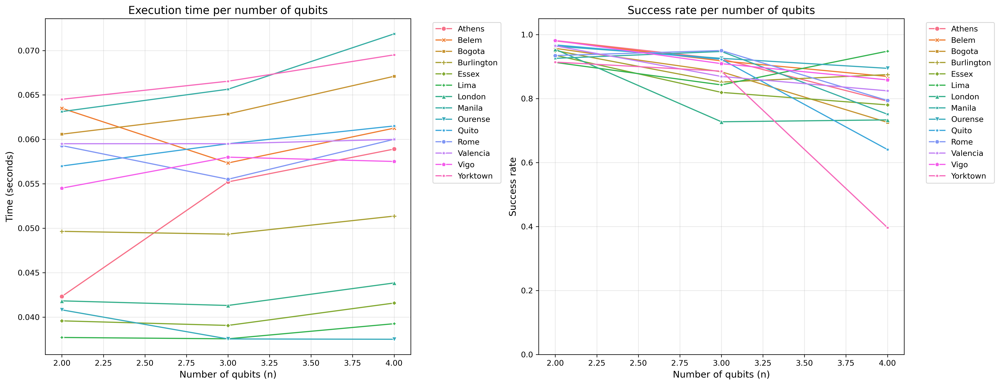

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_5q = pd.DataFrame(resultados_5q)

plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_5q, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Gráfico 2: Tasa de éxito
sns.lineplot(data=df_5q, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend5q.png', bbox_inches='tight')
plt.show()

## **Fake backends de 5 qubits (Refresh)**

In [ ]:
from qiskit_ibm_runtime import QiskitRuntimeService
service = QiskitRuntimeService()

resultados_5q_refresh = []
for nombre, backend in fake_backends_5q:
    backend.refresh(service)
    max_qubits = backend.configuration().num_qubits

    # Vamos a probar para n desde 2 hasta max_qubits-1 (dejamos uno para el qubit auxiliar)
    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]  # Generar s aleatorio
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_5q_refresh.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

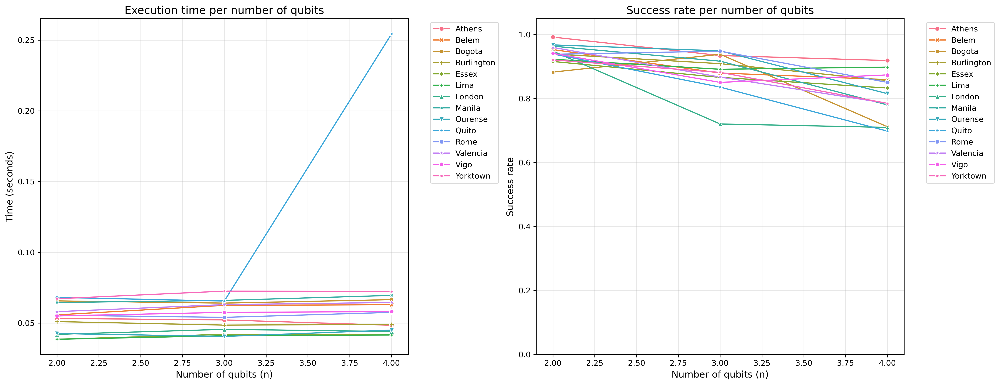

In [ ]:
df_5q_refresh = pd.DataFrame(resultados_5q_refresh)

plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_5q_refresh, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

sns.lineplot(data=df_5q_refresh, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend5q_refresh.png', bbox_inches='tight')
plt.show()

## **Fake backends de 7 qubits**

In [ ]:
resultados_7q = []
for nombre, backend in fake_backends_7q:
    max_qubits = backend.configuration().num_qubits
    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]  # Generar s aleatorio
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_7q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_7q = pd.DataFrame(resultados_7q)

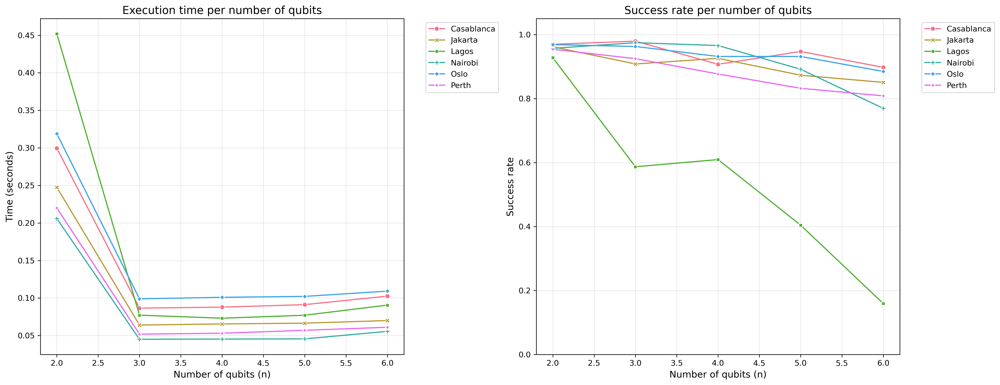

In [ ]:
plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_7q, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Gráfico 2: Tasa de éxito
sns.lineplot(data=df_7q, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend7q.png', bbox_inches='tight')
plt.show()

## **Fake backends de 7 qubits (Refresh)**

In [ ]:
resultados_7q_refresh = []
for nombre, backend in fake_backends_7q:
    backend.refresh(service)
    max_qubits = backend.configuration().num_qubits

    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_7q_refresh.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

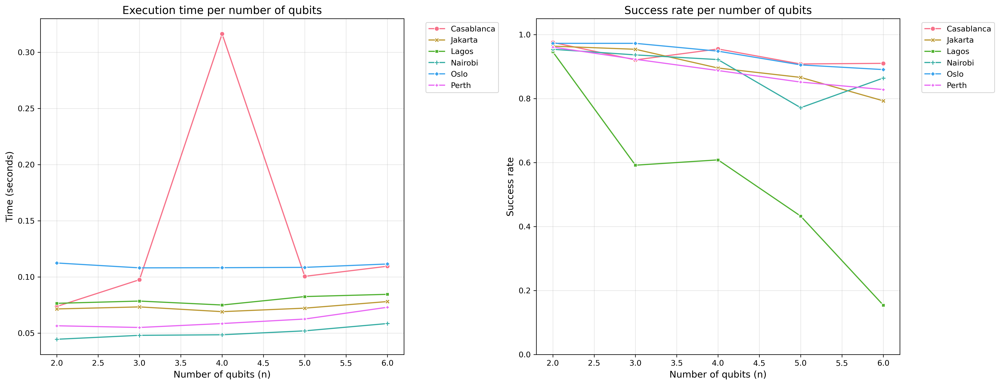

In [ ]:
df_7q_refresh = pd.DataFrame(resultados_7q_refresh)

plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_7q_refresh, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

sns.lineplot(data=df_7q_refresh, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend7q_refresh.png', bbox_inches='tight')
plt.show()

## **Fake backends de 16 qubits**

In [ ]:
resultados_16q = []
for nombre, backend in fake_backends_16q:
    max_qubits = backend.configuration().num_qubits
    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]  # Generar s aleatorio
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_16q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_16q = pd.DataFrame(resultados_16q)

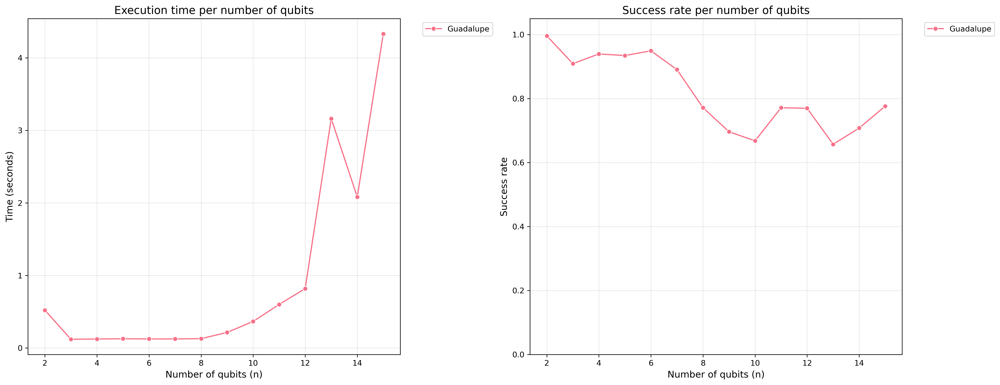

In [ ]:
plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_16q, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

sns.lineplot(data=df_16q, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend16q.png', bbox_inches='tight')
plt.show()

## **Fake backends de 16 qubits (Refresh)**

In [ ]:
resultados_16q_refresh = []
for nombre, backend in fake_backends_16q:
    backend.refresh(service)
    max_qubits = backend.configuration().num_qubits

    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_16q_refresh.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

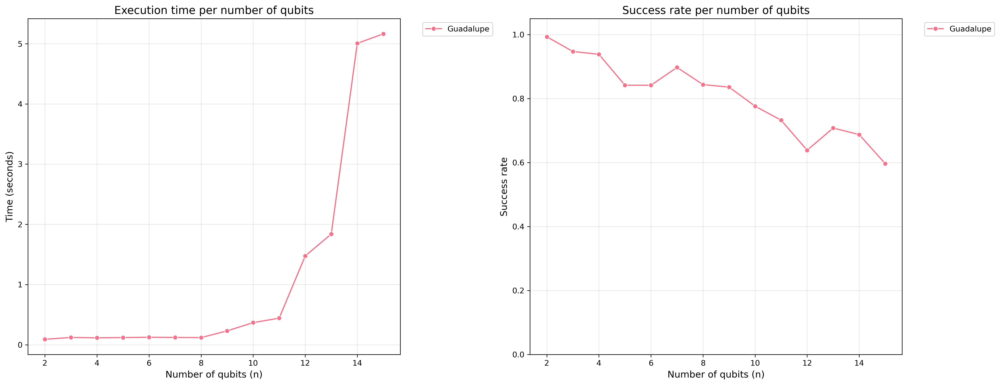

In [ ]:
df_16q_refresh = pd.DataFrame(resultados_16q_refresh)

plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_16q_refresh, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

sns.lineplot(data=df_16q_refresh, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend16q_refresh.png', bbox_inches='tight')
plt.show()

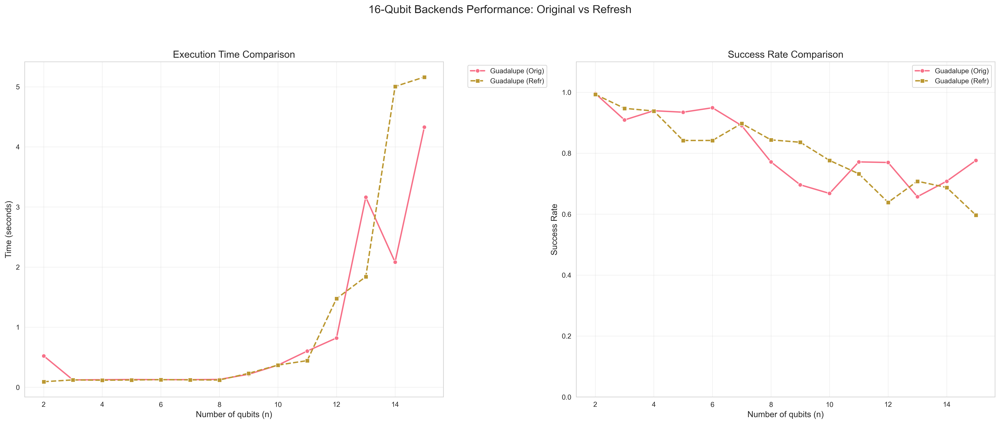

In [ ]:
plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

for backend in df_16q['backend'].unique():
    data_orig = df_16q[df_16q['backend'] == backend]
    sns.lineplot(data=data_orig, x='n', y='tiempo',
                 label=f'{backend} (Orig)', ax=ax1,
                 marker='o', linestyle='-', linewidth=2)


    if backend in df_16q_refresh['backend'].unique():
        data_refr = df_16q_refresh[df_16q_refresh['backend'] == backend]
        sns.lineplot(data=data_refr, x='n', y='tiempo',
                     label=f'{backend} (Refr)', ax=ax1,
                     marker='s', linestyle='--', linewidth=2)

ax1.set_title('Execution Time Comparison', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

for backend in df_16q['backend'].unique():

    data_orig = df_16q[df_16q['backend'] == backend]
    sns.lineplot(data=data_orig, x='n', y='tasa_exito',
                 label=f'{backend} (Orig)', ax=ax2,
                 marker='o', linestyle='-', linewidth=2)


    if backend in df_16q_refresh['backend'].unique():
        data_refr = df_16q_refresh[df_16q_refresh['backend'] == backend]
        sns.lineplot(data=data_refr, x='n', y='tasa_exito',
                     label=f'{backend} (Refr)', ax=ax2,
                     marker='s', linestyle='--', linewidth=2)

ax2.set_title('Success Rate Comparison', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success Rate', fontsize=12)
ax2.set_ylim(0, 1.1)
ax2.grid(True, alpha=0.3)

plt.suptitle('16-Qubit Backends Performance: Original vs Refresh', y=1.05, fontsize=16)
plt.tight_layout()
plt.savefig('superposed_comparison_16q.png', bbox_inches='tight', dpi=300)
plt.show()

## **Fake backends de 27 qubits**

In [ ]:
resultados_27q = []
for nombre, backend in fake_backends_27q:
    max_qubits = backend.configuration().num_qubits


    for n in range(2, max_qubits):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_27q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_27q = pd.DataFrame(resultados_27q)

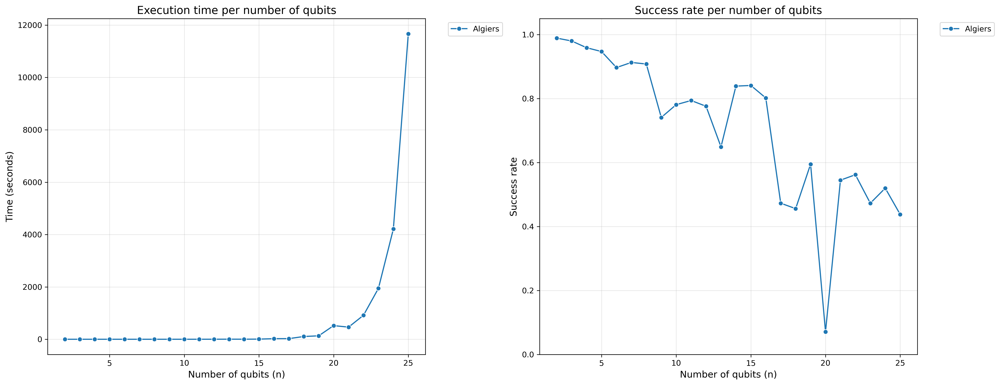

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


data = {
    "n": [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26],
    "Cadena_secreta": ["01", "100", "1010", "11010", "001111", "0110101", "00110011", "110011111", "1101011101",
                      "11001010011", "101011100111", "1101110101101", "10101001000010", "011001000011010",
                      "1110001001001100", "01100111001111110", "011111110100011101", "1001100110011110100",
                      "01110100101111110011", "110000010111111110110", "0110111111010000100000",
                      "01001011101011000110110", "100010100100000111001100", "1111110110111011000110000",
                      "01111101000100100001011101"],
    "tiempo": [0.192, 0.214, 0.314, 0.206, 0.216, 0.212, 0.213, 0.397, 0.523, 0.817, 1.539, 3.269, 2.332,
               5.653, 22.499, 24.292, 105.559, 131.484, 521.343, 463.221, 916.347, 1944.030, 4211.692,
               11664.844, None],
    "tasa_exito": [0.989, 0.980, 0.959, 0.947, 0.897, 0.913, 0.908, 0.741, 0.781, 0.794, 0.776, 0.649, 0.839,
                   0.841, 0.802, 0.473, 0.456, 0.595, 0.071, 0.545, 0.562, 0.473, 0.520, 0.438, None]
}

df_27q = pd.DataFrame(data)

df_27q['backend'] = 'Algiers'
plt.rcParams['figure.dpi'] = 300
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))


sns.lineplot(data=df_27q, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax1)
ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


sns.lineplot(data=df_27q, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False,
             ax=ax2)
ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('comparacion_backend27q.png', bbox_inches='tight')
plt.show()

**Here i couldn't finish the test due to the exponenctial time execution growth, so i stopped at 26 qubit test because, it costs 4 hours and 8 hours had passed already. Output results were recollected and put it into a dataframe to plot it**  

## **TEST 0-10 QUBITS FOR ALL THE FAKE PROVIDERS WITH MORE THAN 10 QUBITS**

In [ ]:
resultados_14q = []
for nombre, backend in fake_backends_14q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_14q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_14q_wthout_opt = pd.DataFrame(resultados_14q)


resultados_16q = []
for nombre, backend in fake_backends_16q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_16q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_16q_wthout_opt = pd.DataFrame(resultados_16q)


resultados_27q = []
for nombre, backend in fake_backends_27q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_27q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_27q_wthout_opt = pd.DataFrame(resultados_27q)


resultados_33q = []
for nombre, backend in fake_backends_33q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_33q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_33q_wthout_opt = pd.DataFrame(resultados_33q)


resultados_127q = []
for nombre, backend in fake_backends_127q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_127q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_127q_wthout_opt = pd.DataFrame(resultados_127q)


resultados_133q = []
for nombre, backend in fake_backends_133q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_133q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_133q_wthout_opt = pd.DataFrame(resultados_133q)


resultados_156q = []
for nombre, backend in fake_backends_156q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend(n, s, backend, nombre, shots=1024, verbose=True)
            resultados_156q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_156q_wthout_opt = pd.DataFrame(resultados_156q)


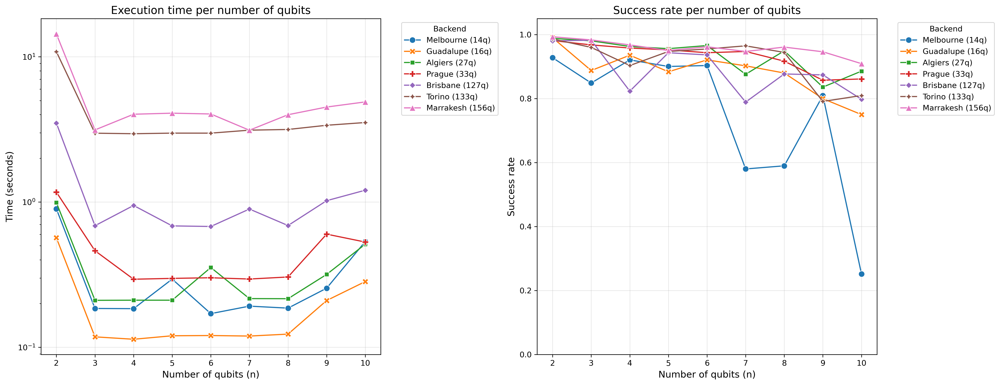

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Combinar todos los DataFrames en uno solo
df_completo = pd.concat([
    df_14q_wthout_opt.assign(backend='Melbourne (14q)'),
    df_16q_wthout_opt.assign(backend='Guadalupe (16q)'),
    df_27q_wthout_opt.assign(backend='Algiers (27q)'),
    df_33q_wthout_opt.assign(backend='Prague (33q)'),
    df_127q_wthout_opt.assign(backend='Brisbane (127q)'),
    df_133q_wthout_opt.assign(backend='Torino (133q)'),
    df_156q_wthout_opt.assign(backend='Marrakesh (156q)')
], ignore_index=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))


sns.lineplot(data=df_completo, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax1,
             palette='tab10', linewidth=1.5, markersize=8)

ax1.set_title('Execution time per number of qubits', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')
ax1.set_yscale('log')

sns.lineplot(data=df_completo, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax2,
             palette='tab10', linewidth=1.5, markersize=8)

ax2.set_title('Success rate per number of qubits', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')

# Ajustar layout y guardar
plt.tight_layout()
plt.savefig('comparacion_backends_2-10q.png', bbox_inches='tight', dpi=300)
plt.show()

## **TEST 0-10 qubits for all fake providers with more than 10 qubits (and optimization)**

Real quantum devices are subject to noise and gate errors, so optimizing the circuits to reduce their depth and gate count can significantly improve the results obtained from executing those circuits. The generate_preset_pass_manager function has one required positional argument, `optimization_level`, that controls how much effort the transpiler spends on optimizing circuits. This argument can be an integer taking one of the values 0, 1, 2, or 3. Higher **optimization level** generate more optimized circuits at the expense of longer compile times. The following table explains the optimizations performed with each setting.

| Level            | What It Does                                                                                                                                     | When To Use It                                                                                  |
|------------------|--------------------------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------|
| **Level 0**       | The simplest approach with no optimizations. Uses basic qubit mapping where virtual qubits match physical qubits, adding only the necessary SWAP operations. Perfect for when you want to see exactly how your circuit would run with minimal interference. | • Hardware testing<br>• Debugging raw circuits<br>• When you need zero optimization interference |
| **Level 1**       | Light optimizations that smarten up your circuit without heavy processing. Starts with simple mapping but will find better layouts if needed. Cleans up unnecessary gates and combines operations where possible. | • Everyday experiments<br>• Quick executions<br>• When you want some optimization without long compile times |
| **Level 2**       | More sophisticated optimizations that really work on improving your circuit. Doesn't assume simple qubit mapping, searches harder for better layouts, and does advanced gate cancellation. | • Production circuits<br>• When you need better performance<br>• Medium-complexity algorithms |
| **Level 3**       | The full optimization package. Everything from Level 2 plus advanced techniques like gate resynthesis that can fundamentally restructure two-qubit operations for better performance. | • Critical applications<br>• Large, complex circuits<br>• When every bit of performance counts |
| **Special Passes**| These optimizations specifically handle measurement operations:<br>• Smart measurement repositioning to avoid SWAPs<br>• Removing gates that don't affect measurement outcomes | • Circuits with many measurements<br>• When measurement timing is critical<br>• Reducing classical overhead |


In [ ]:
def ejecutar_en_backend_con_opt(qc, backend, opt, shots=1024,):
    qc_obj = transpile(qc, backend, optimization_level=opt)
    job = backend.run(qc_obj, shots=shots)
    result = job.result()
    counts = result.get_counts()
    return counts

def correr_benchmark_backend_con_opt(n, s, backend, nombre_backend, opt,  shots=1024, verbose=False):
    s_bin = ''.join(map(str, s))
    if verbose:
        print(f"[{nombre_backend}] Cadena secreta (s): {s_bin}")

    # Crear circuito BV
    circuito = QuantumCircuit(n+1, n)
    circuito.x(n)
    circuito.h(range(n+1))
    circuito = circuito.compose(bv_oraculo_personalizado(s))
    circuito.barrier()
    circuito.h(range(n))
    circuito.measure(range(n), range(n))

    inicio = time.time()
    counts = ejecutar_en_backend_con_opt(circuito, backend, opt, shots)
    fin = time.time()

    tiempo = fin - inicio
    tasa_exito = calcular_tasa_exito(counts, s_bin)

    if verbose:
        print(f"[{nombre_backend}] Tiempo: {tiempo:.3f} s | Tasa de éxito: {tasa_exito:.3f}")

    return {
        "backend": nombre_backend,
        "n": n,
        "s": s_bin,
        "tiempo": tiempo,
        "tasa_exito": tasa_exito,
        "counts": counts
    }


## **Optimization level = 1**

In [ ]:
resultados_14q = []
for nombre, backend in fake_backends_14q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre, 1, shots=1024, verbose=True)
            resultados_14q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_14q_wth_opt_1 = pd.DataFrame(resultados_14q)


resultados_16q = []
for nombre, backend in fake_backends_16q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_16q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_16q_wth_opt_1 = pd.DataFrame(resultados_16q)


resultados_27q = []
for nombre, backend in fake_backends_27q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_27q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_27q_wth_opt_1 = pd.DataFrame(resultados_27q)


resultados_33q = []
for nombre, backend in fake_backends_33q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_33q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_33q_wth_opt_1 = pd.DataFrame(resultados_33q)


resultados_127q = []
for nombre, backend in fake_backends_127q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_127q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_127q_wth_opt_1 = pd.DataFrame(resultados_127q)


resultados_133q = []
for nombre, backend in fake_backends_133q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_133q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_133q_wth_opt_1 = pd.DataFrame(resultados_133q)


resultados_156q = []
for nombre, backend in fake_backends_156q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,1, shots=1024, verbose=True)
            resultados_156q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_156q_wth_opt_1 = pd.DataFrame(resultados_156q)


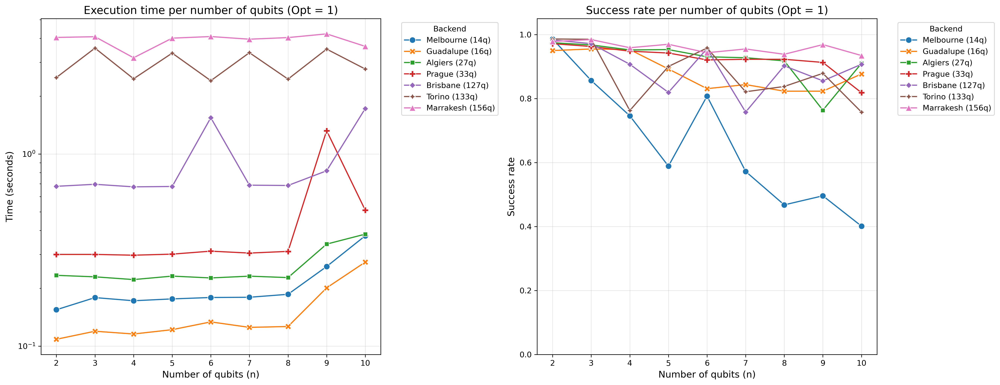

In [ ]:
# Combinar todos los DataFrames en uno solo
df_completo_1 = pd.concat([
    df_14q_wth_opt_1.assign(backend='Melbourne (14q)'),
    df_16q_wth_opt_1.assign(backend='Guadalupe (16q)'),
    df_27q_wth_opt_1.assign(backend='Algiers (27q)'),
    df_33q_wth_opt_1.assign(backend='Prague (33q)'),
    df_127q_wth_opt_1.assign(backend='Brisbane (127q)'),
    df_133q_wth_opt_1.assign(backend='Torino (133q)'),
    df_156q_wth_opt_1.assign(backend='Marrakesh (156q)')
], ignore_index=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))


sns.lineplot(data=df_completo_1, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax1,
             palette='tab10', linewidth=1.5, markersize=8)

ax1.set_title('Execution time per number of qubits (Opt = 1)', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')
ax1.set_yscale('log')

sns.lineplot(data=df_completo_1, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax2,
             palette='tab10', linewidth=1.5, markersize=8)

ax2.set_title('Success rate per number of qubits (Opt = 1)', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')

# Ajustar layout y guardar
plt.tight_layout()
plt.savefig('comparacion_backends_2-10q_opt_1.png', bbox_inches='tight', dpi=300)
plt.show()

## **Optimization level = 2**

In [ ]:
resultados_14q = []
for nombre, backend in fake_backends_14q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre, 2, shots=1024, verbose=True)
            resultados_14q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_14q_wth_opt_2 = pd.DataFrame(resultados_14q)


resultados_16q = []
for nombre, backend in fake_backends_16q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_16q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_16q_wth_opt_2 = pd.DataFrame(resultados_16q)


resultados_27q = []
for nombre, backend in fake_backends_27q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_27q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_27q_wth_opt_2 = pd.DataFrame(resultados_27q)


resultados_33q = []
for nombre, backend in fake_backends_33q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_33q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_33q_wth_opt_2 = pd.DataFrame(resultados_33q)


resultados_127q = []
for nombre, backend in fake_backends_127q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_127q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_127q_wth_opt_2 = pd.DataFrame(resultados_127q)


resultados_133q = []
for nombre, backend in fake_backends_133q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_133q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_133q_wth_opt_2 = pd.DataFrame(resultados_133q)


resultados_156q = []
for nombre, backend in fake_backends_156q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,2, shots=1024, verbose=True)
            resultados_156q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_156q_wth_opt_2 = pd.DataFrame(resultados_156q)


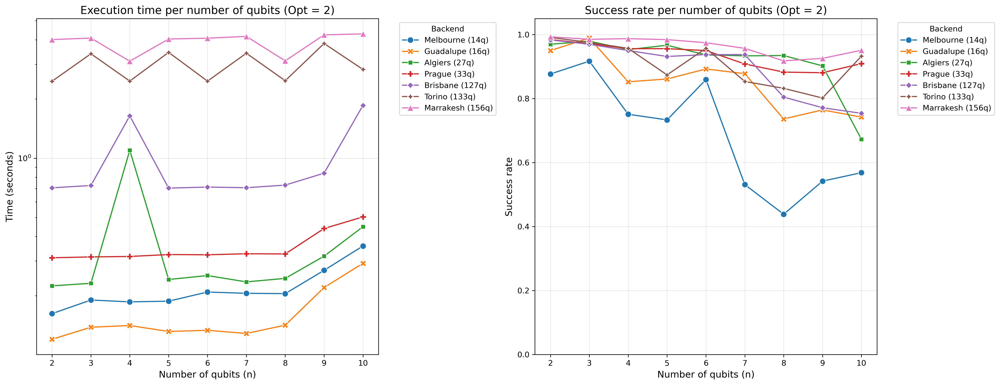

In [ ]:

df_completo_2 = pd.concat([
    df_14q_wth_opt_2.assign(backend='Melbourne (14q)'),
    df_16q_wth_opt_2.assign(backend='Guadalupe (16q)'),
    df_27q_wth_opt_2.assign(backend='Algiers (27q)'),
    df_33q_wth_opt_2.assign(backend='Prague (33q)'),
    df_127q_wth_opt_2.assign(backend='Brisbane (127q)'),
    df_133q_wth_opt_2.assign(backend='Torino (133q)'),
    df_156q_wth_opt_2.assign(backend='Marrakesh (156q)')
], ignore_index=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))


sns.lineplot(data=df_completo_2, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax1,
             palette='tab10', linewidth=1.5, markersize=8)

ax1.set_title('Execution time per number of qubits (Opt = 2)', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')
ax1.set_yscale('log')

sns.lineplot(data=df_completo_2, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax2,
             palette='tab10', linewidth=1.5, markersize=8)

ax2.set_title('Success rate per number of qubits (Opt = 2)', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')

# Ajustar layout y guardar
plt.tight_layout()
plt.savefig('comparacion_backends_2-10q_opt_2.png', bbox_inches='tight', dpi=300)
plt.show()

## **Optimization level = 3**

In [ ]:
resultados_14q = []
for nombre, backend in fake_backends_14q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre, 3, shots=1024, verbose=True)
            resultados_14q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_14q_wth_opt_3 = pd.DataFrame(resultados_14q)


resultados_16q = []
for nombre, backend in fake_backends_16q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_16q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_16q_wth_opt_3 = pd.DataFrame(resultados_16q)


resultados_27q = []
for nombre, backend in fake_backends_27q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_27q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_27q_wth_opt_3 = pd.DataFrame(resultados_27q)


resultados_33q = []
for nombre, backend in fake_backends_33q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_33q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_33q_wth_opt_3 = pd.DataFrame(resultados_33q)


resultados_127q = []
for nombre, backend in fake_backends_127q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_127q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_127q_wth_opt_3 = pd.DataFrame(resultados_127q)


resultados_133q = []
for nombre, backend in fake_backends_133q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_133q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_133q_wth_opt_3 = pd.DataFrame(resultados_133q)


resultados_156q = []
for nombre, backend in fake_backends_156q:
    for n in range(2, min(11, backend.configuration().num_qubits)):
        s = [np.random.randint(2) for _ in range(n)]
        try:
            resultado = correr_benchmark_backend_con_opt(n, s, backend, nombre,3, shots=1024, verbose=True)
            resultados_156q.append(resultado)
        except Exception as e:
            print(f"[{nombre}] Error con n={n}: {e}")

df_156q_wth_opt_3 = pd.DataFrame(resultados_156q)


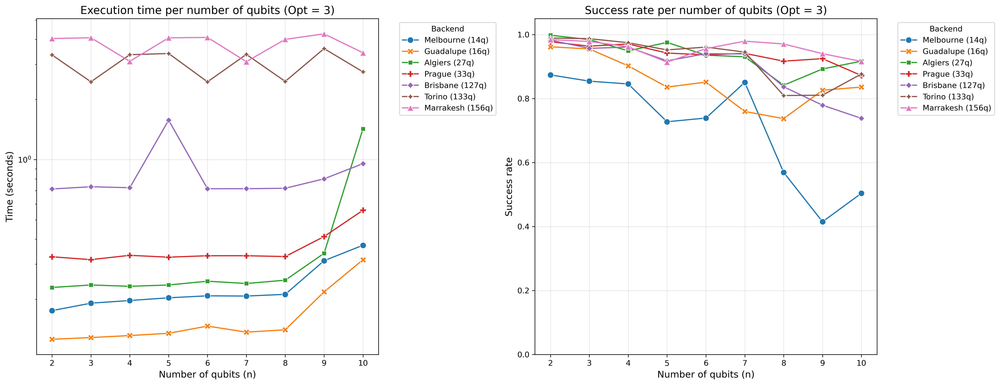

In [ ]:
# Combinar todos los DataFrames en uno solo
df_completo_3 = pd.concat([
    df_14q_wth_opt_3.assign(backend='Melbourne (14q)'),
    df_16q_wth_opt_3.assign(backend='Guadalupe (16q)'),
    df_27q_wth_opt_3.assign(backend='Algiers (27q)'),
    df_33q_wth_opt_3.assign(backend='Prague (33q)'),
    df_127q_wth_opt_3.assign(backend='Brisbane (127q)'),
    df_133q_wth_opt_3.assign(backend='Torino (133q)'),
    df_156q_wth_opt_3.assign(backend='Marrakesh (156q)')
], ignore_index=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 10

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
sns.lineplot(data=df_completo_3, x='n', y='tiempo', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax1,
             palette='tab10', linewidth=1.5, markersize=8)

ax1.set_title('Execution time per number of qubits (Opt = 3)', fontsize=14)
ax1.set_xlabel('Number of qubits (n)', fontsize=12)
ax1.set_ylabel('Time (seconds)', fontsize=12)
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')
ax1.set_yscale('log')

sns.lineplot(data=df_completo_3, x='n', y='tasa_exito', hue='backend',
             style='backend', markers=True, dashes=False, ax=ax2,
             palette='tab10', linewidth=1.5, markersize=8)

ax2.set_title('Success rate per number of qubits (Opt = 3)', fontsize=14)
ax2.set_xlabel('Number of qubits (n)', fontsize=12)
ax2.set_ylabel('Success rate', fontsize=12)
ax2.set_ylim(0, 1.05)
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Backend')

plt.tight_layout()
plt.savefig('comparacion_backends_2-10q_opt_3.png', bbox_inches='tight', dpi=300)
plt.show()

# **Studyng the optimization level benefits for each fake backend**

| Level        | Suitable for this circuit? | Justification                                                                                                                                                                                              |
|--------------|----------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Level 0**  | ❌ Not useful               | Applies no optimization. Only good for debugging or verifying that the gates are inserted correctly.                                                                                                      |
| **Level 1**  | ✅ Acceptable               | Performs basic cleanup: removes redundant gates, optimizes SWAPs if needed, and simplifies trivial operations. Useful if you care about keeping low latency without losing fidelity.                      |
| **Level 2**  | ✅ Recommended              | Applies better heuristics for **physical/virtual qubit mapping** and more advanced **gate cancellations**. Improves fidelity of results, especially as the circuit grows with `n`.                         |
| **Level 3**  | 🔄 It depends               | Might help, but for very small circuits like this, resynthesizing two-qubit operations may not bring much benefit and could increase compilation time.                                                     |


In [ ]:
df_14q_wth_opt_1["opt_level"] = 1
df_14q_wth_opt_2["opt_level"] = 2
df_14q_wth_opt_3["opt_level"] = 3
df_14q_wthout_opt["opt_level"] = 0

df_16q_wth_opt_1["opt_level"] = 1
df_16q_wth_opt_2["opt_level"] = 2
df_16q_wth_opt_3["opt_level"] = 3
df_16q_wthout_opt["opt_level"] = 0


df_27q_wth_opt_1["opt_level"] = 1
df_27q_wth_opt_2["opt_level"] = 2
df_27q_wth_opt_3["opt_level"] = 3
df_27q_wthout_opt["opt_level"] = 0

df_33q_wth_opt_1["opt_level"] = 1
df_33q_wth_opt_2["opt_level"] = 2
df_33q_wth_opt_3["opt_level"] = 3
df_33q_wthout_opt["opt_level"] = 0


df_127q_wth_opt_1["opt_level"] = 1
df_127q_wth_opt_2["opt_level"] = 2
df_127q_wth_opt_3["opt_level"] = 3
df_127q_wthout_opt["opt_level"] = 0

df_133q_wth_opt_1["opt_level"] = 1
df_133q_wth_opt_2["opt_level"] = 2
df_133q_wth_opt_3["opt_level"] = 3
df_133q_wthout_opt["opt_level"] = 0

df_156q_wth_opt_1["opt_level"] = 1
df_156q_wth_opt_2["opt_level"] = 2
df_156q_wth_opt_3["opt_level"] = 3
df_156q_wthout_opt["opt_level"] = 0

df_14q_all = pd.concat([
    df_14q_wthout_opt,
    df_14q_wth_opt_1,
    df_14q_wth_opt_2,
    df_14q_wth_opt_3
])

df_16q_all = pd.concat([
    df_16q_wthout_opt,
    df_16q_wth_opt_1,
    df_16q_wth_opt_2,
    df_16q_wth_opt_3
])

df_27q_all = pd.concat([
    df_27q_wthout_opt,
    df_27q_wth_opt_1,
    df_27q_wth_opt_2,
    df_27q_wth_opt_3
])

df_33q_all = pd.concat([
    df_33q_wthout_opt,
    df_33q_wth_opt_1,
    df_33q_wth_opt_2,
    df_33q_wth_opt_3
])

df_127q_all = pd.concat([
    df_127q_wthout_opt,
    df_127q_wth_opt_1,
    df_127q_wth_opt_2,
    df_127q_wth_opt_3
])

df_133q_all = pd.concat([
    df_133q_wthout_opt,
    df_133q_wth_opt_1,
    df_133q_wth_opt_2,
    df_133q_wth_opt_3
])

df_156q_all = pd.concat([
    df_156q_wthout_opt,
    df_156q_wth_opt_1,
    df_156q_wth_opt_2,
    df_156q_wth_opt_3
])

def graficar_backend(df, nombre):

    # Gráfico 1: Tiempos de ejecución
    sns.set_palette("bright")
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.lineplot(data=df, x="n", y="tiempo", palette='tab10',hue="opt_level", marker="o")
    plt.title(f"Execution times - {nombre}")
    plt.xlabel("Number of qubits")
    plt.ylabel("Time (s)")

    plt.subplot(1, 2, 2)
    sns.lineplot(data=df, x="n", y="tasa_exito",palette='tab10', hue="opt_level", marker="o")
    plt.title(f"Success rate - {nombre}")
    plt.xlabel("Number of qubits")
    plt.ylabel("Success rate")
    plt.savefig(f'comparacion_{nombre}.png',
                bbox_inches='tight',
                dpi=300)
    plt.tight_layout()
    plt.show()

# Backends de 14 qubits
fake_back_melbourne = FakeMelbourneV2()

# Backends de 16 qubits
fake_back_guadalupe = FakeGuadalupeV2()

# Backends de 27 qubits
fake_back_algiers = FakeAlgiers()

# Backends de 33 qubits
fake_back_prague = FakePrague()

# Backends de 127 qubits
fake_back_brisbane = FakeBrisbane()
# Backends de 133 qubits
fake_back_torino = FakeTorino()

# Backends de 156 qubits
fake_back_fez = FakeFez()
fake_back_marrakesh = FakeMarrakesh()





# **Analizing Melbourn fake backend**

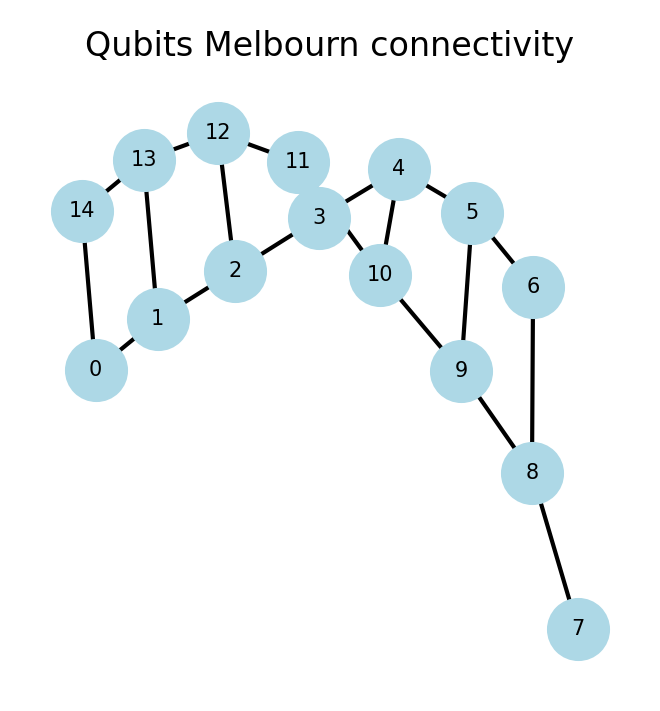

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

coupling_map = fake_back_melbourne.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(2, 2))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=200, font_size=5)
plt.title("Qubits Melbourn connectivity", fontsize=8)
plt.show()

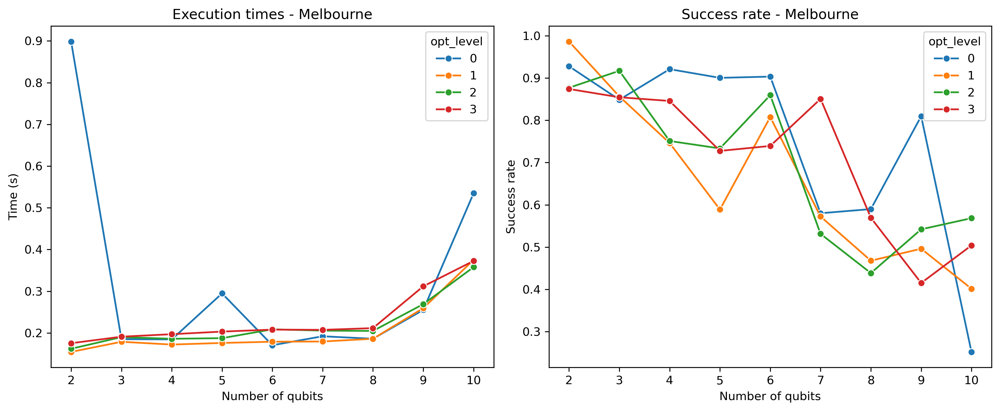

In [ ]:
graficar_backend(df_14q_all, "Melbourne")

# **Analizing Guadalupe fake backend**

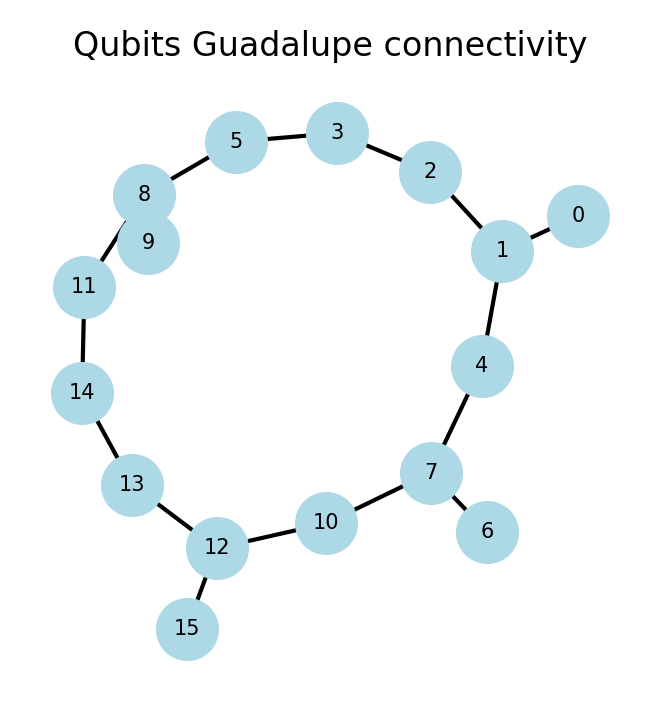

In [ ]:
coupling_map = fake_back_guadalupe.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(2, 2))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=200, font_size=5)
plt.title("Qubits Guadalupe connectivity", fontsize=8)
plt.show()

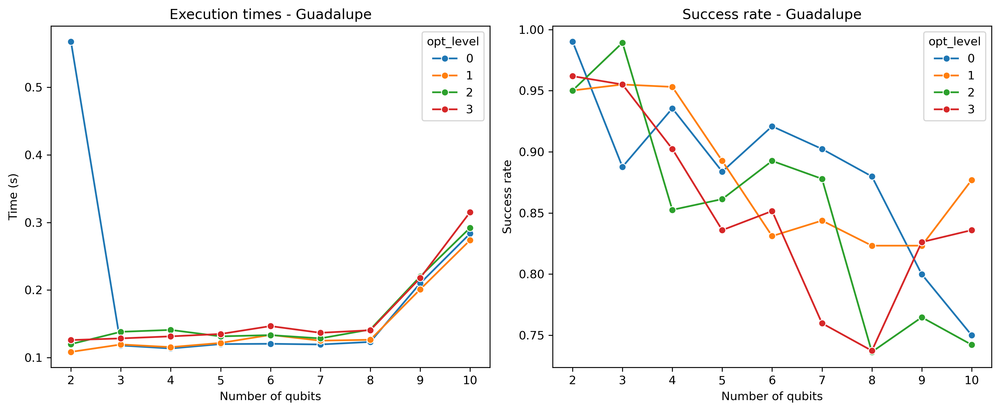

In [ ]:
graficar_backend(df_16q_all, "Guadalupe")

# **Analizing Algiers fake backend**

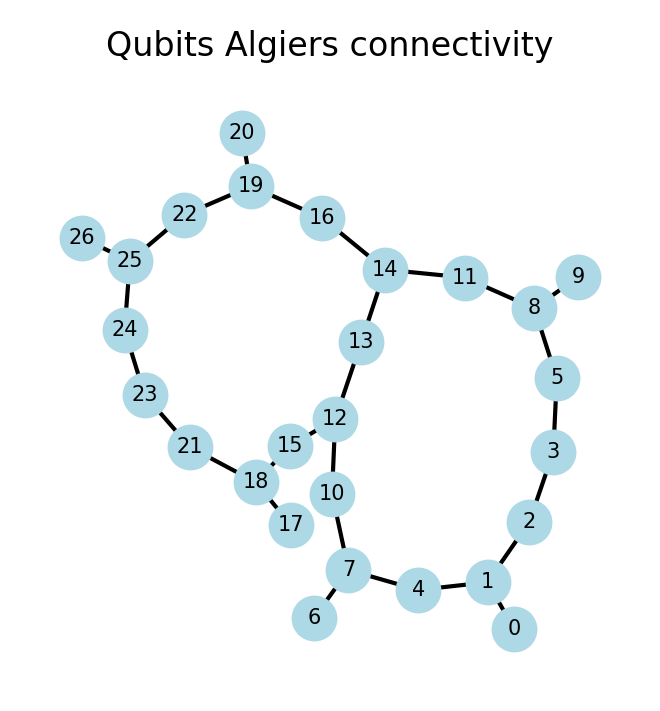

In [ ]:
coupling_map = fake_back_algiers.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(2, 2))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=100, font_size=5)
plt.title("Qubits Algiers connectivity", fontsize=8)
plt.show()

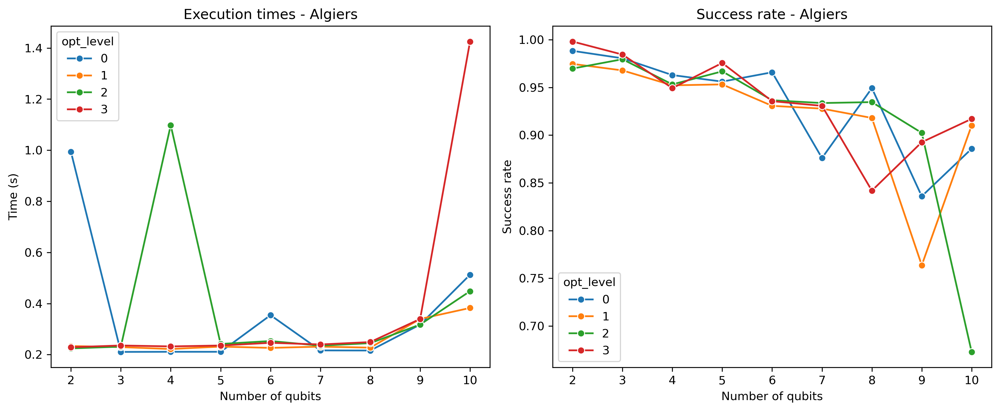

In [ ]:
graficar_backend(df_27q_all, "Algiers")

# **Analizing Prague fake backend**

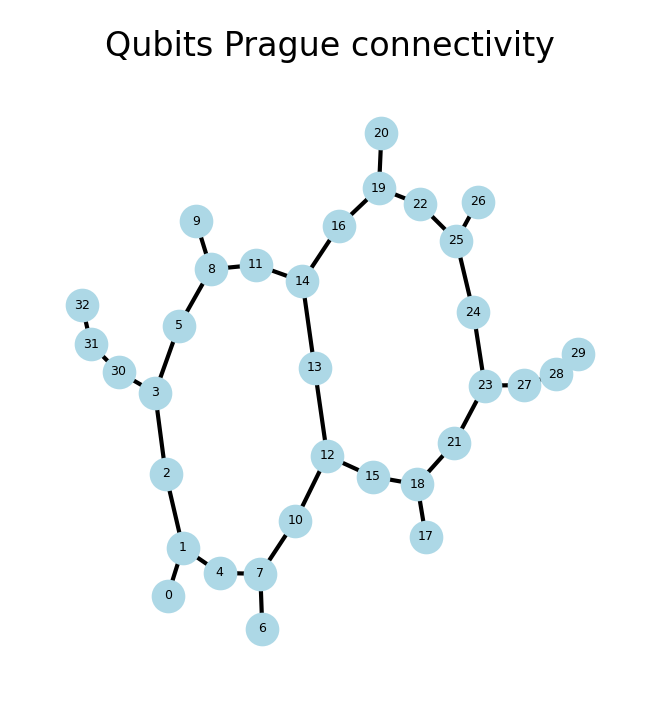

In [ ]:
coupling_map = fake_back_prague.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(2, 2))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=50, font_size=3)
plt.title("Qubits Prague connectivity", fontsize=8)
plt.show()

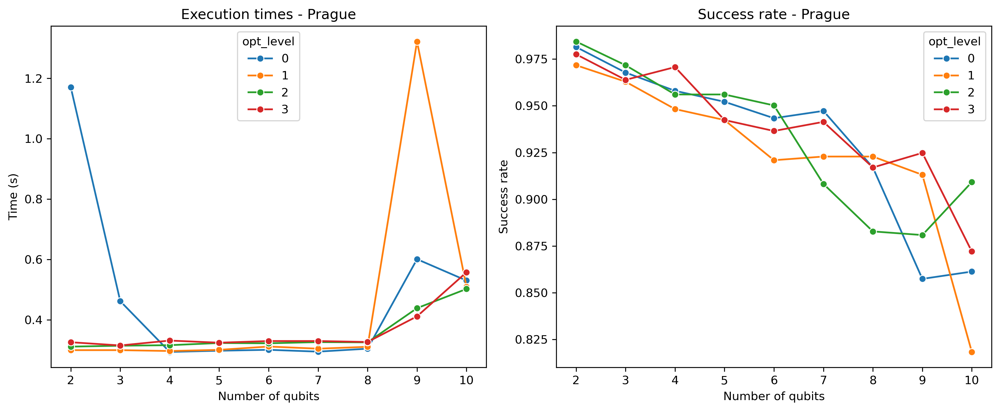

In [ ]:
graficar_backend(df_33q_all, "Prague")

# **Analizing Brisbane fake backend**

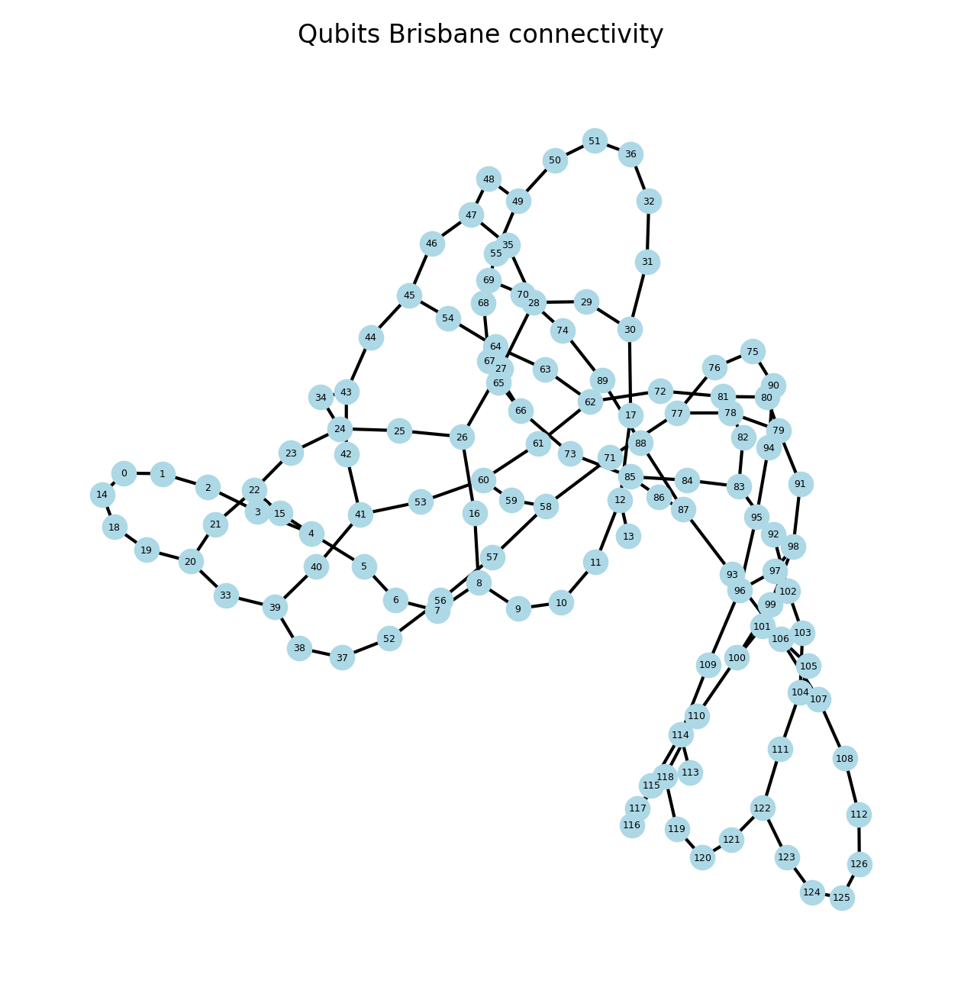

In [ ]:
coupling_map = fake_back_brisbane.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(4, 4))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=50, font_size=3)
plt.title("Qubits Brisbane connectivity", fontsize=8)
plt.show()

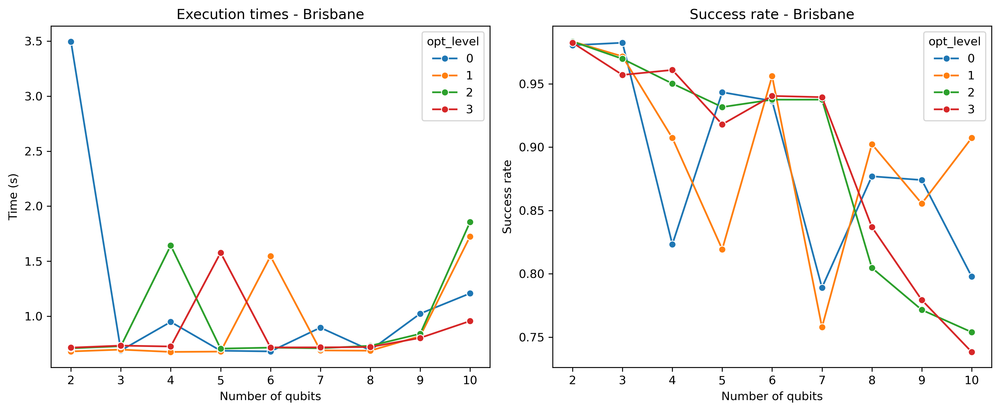

In [ ]:
graficar_backend(df_127q_all, "Brisbane")

# **Analizing Torino fake backend**

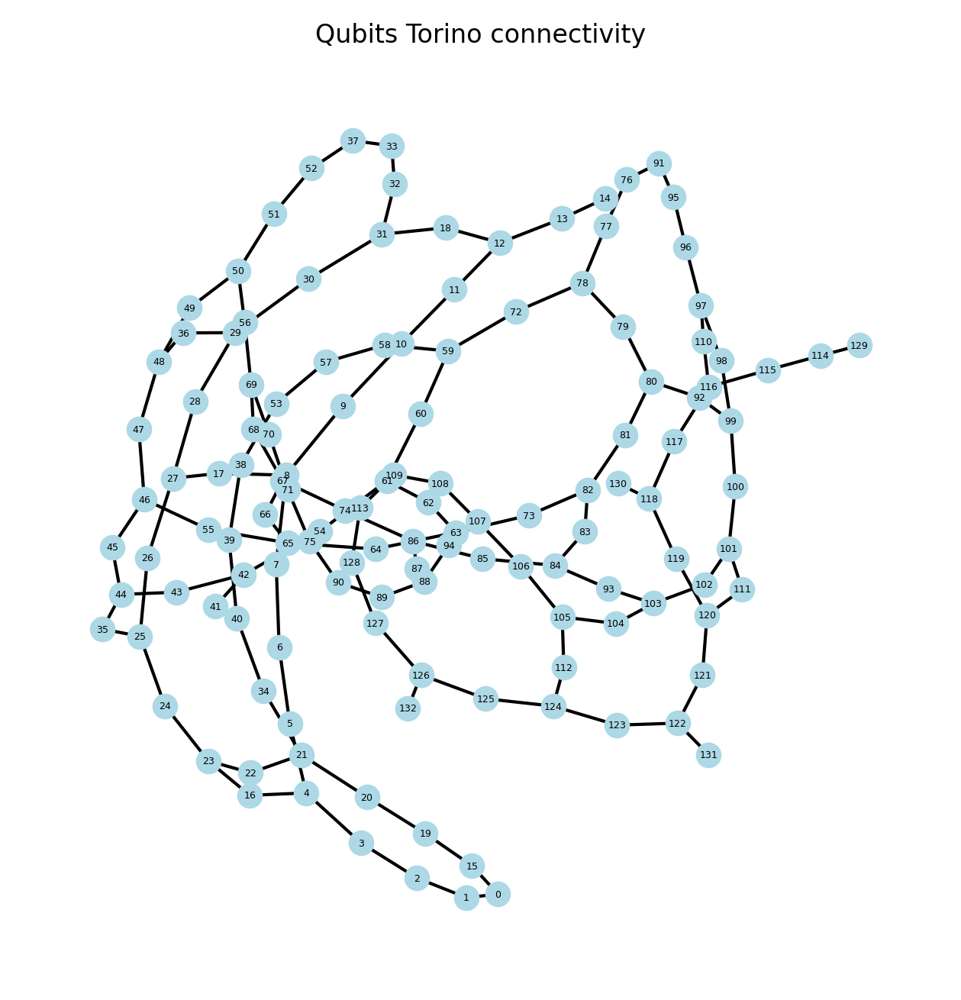

In [ ]:
coupling_map = fake_back_torino.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(4, 4))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=50, font_size=3)
plt.title("Qubits Torino connectivity", fontsize=8)
plt.show()

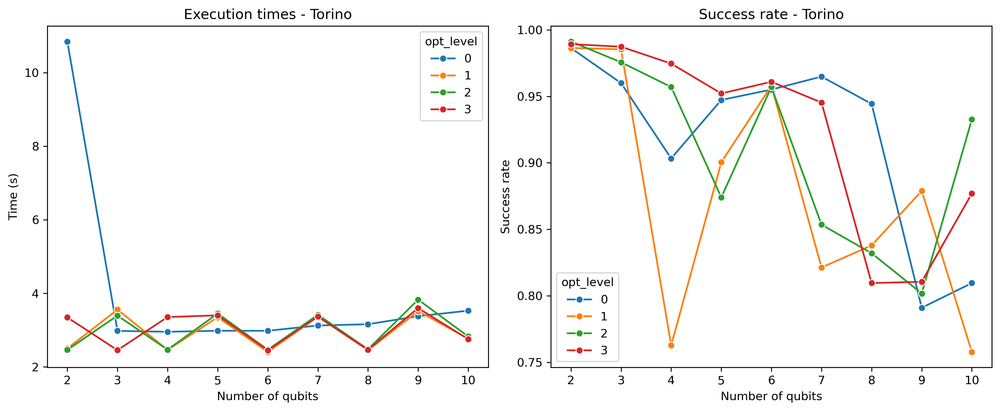

In [ ]:
graficar_backend(df_133q_all, "Torino")

# **Analizing Marrakesh fake backend**

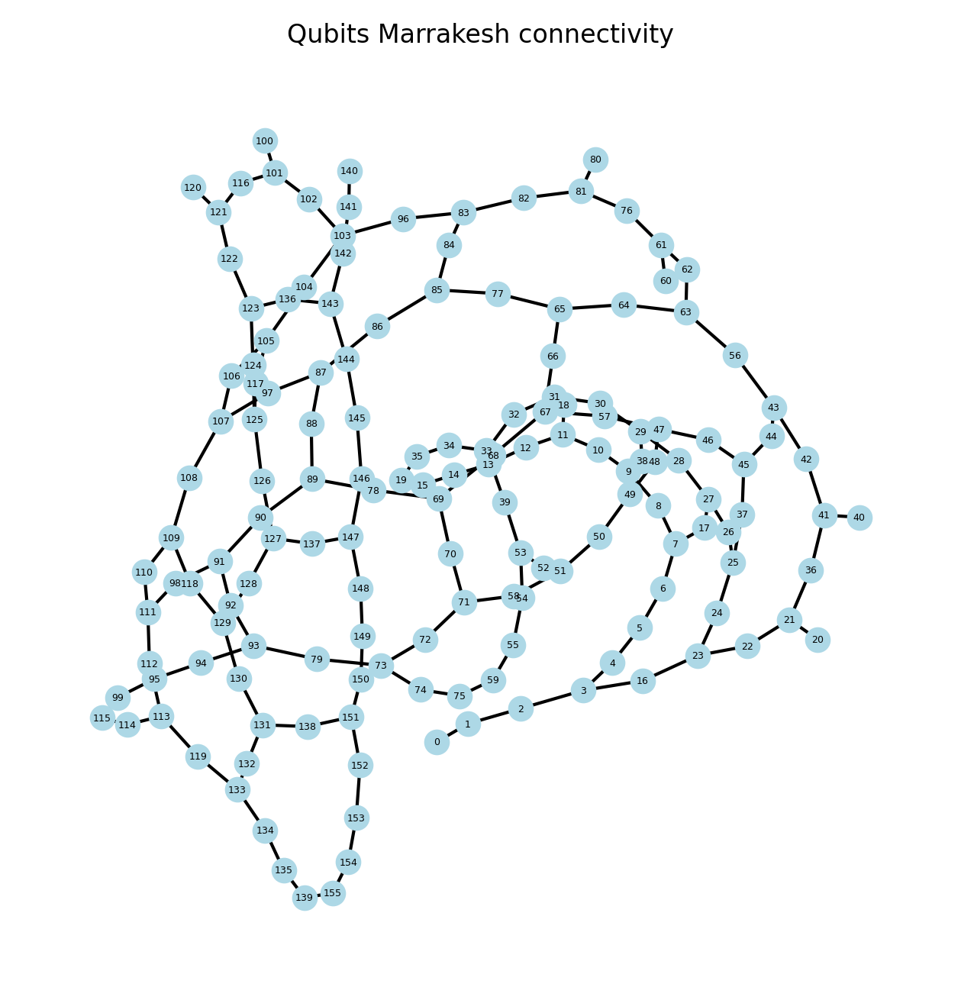

In [ ]:
coupling_map = fake_back_marrakesh.configuration().coupling_map

G = nx.Graph()
G.add_edges_from(coupling_map)

plt.figure(figsize=(4, 4))
nx.draw(G, with_labels=True, node_color='lightblue', node_size=50, font_size=3)
plt.title("Qubits Marrakesh connectivity", fontsize=8)
plt.show()

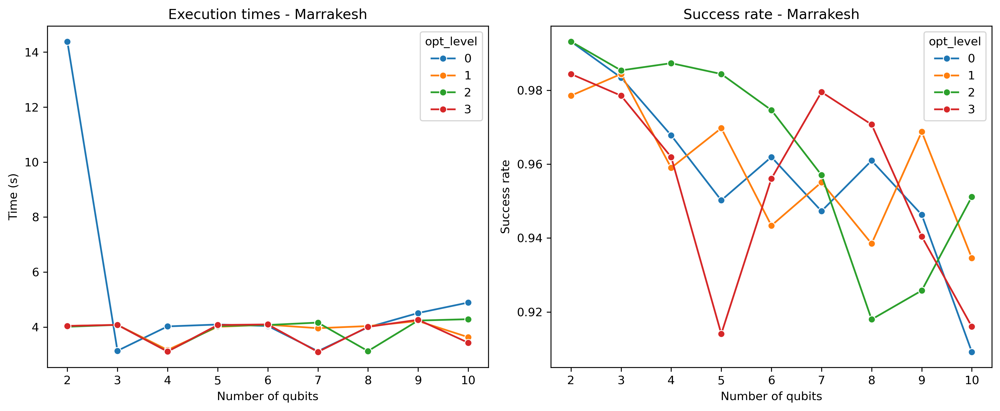

In [ ]:
graficar_backend(df_156q_all, "Marrakesh")

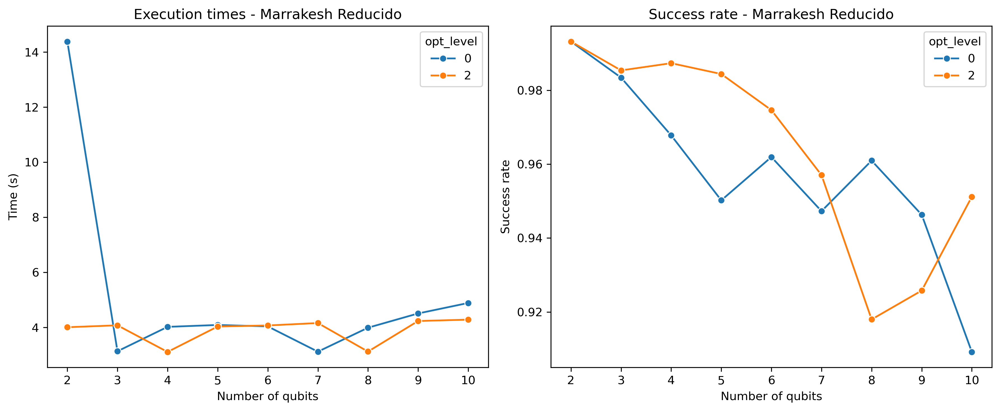

In [ ]:
df_156q_all_red = pd.concat([
    df_156q_wthout_opt,
    df_156q_wth_opt_2,
])

graficar_backend(df_156q_all_red, "Marrakesh Reducido")


# **Conclusions**

Qubits conectivity has a important impact on the performance and  on the efficiency of quantum circuits. For example, if our circuit needs to interact using CNOT gates but are not directly connected, the compiler must insert SWAP gates to bring them next to each other, As we jbiwm aa subgke SWAP is equivalent to 3 CNOT gates, which adds errors, depth and higher execution times. Also, poor connectivity leads to many additional gates, thus, lower fidelity and higher decoherence. Moreover, the compiler´s job becomes even more complex when qubits are sprsely connected, so it must find an efficient mapping of logical qubits to physical ones. All of these, increase compilation time and could reduce optimization quality due to topology limited.

We could see a better performance using fake providers with higher number of qubits. This is because bigger fake backends usually hve better connectivity, lower error tayes ad more optimization. Bugger backends are tipically designed with improved topologies, thus, more direct connections between qubits and fewer swap gates needed to implement multi-qubit operations. Furthermore, these fake backends imulates real IBM devices with their nose profiles, so, larger devices often come from newer generations of IBM processors and they typically have lower gate error, longer coherence times and better measurement fidelity.

So, with more qubits the compiler has more flexibility to map our logical circuit into a better layout, avoiding faulty qubits or noisy regions. With less qubits, we have more limited connections, where two-qubits gates often compete for the same qubit path.

![comparacion_backends_2-10q_opt_2.png](attachment:d4b21458-39bd-46a6-8925-3dcb511aa873.png)

It´s very easy to see that the fake backend Marrakesh has the better performance. It's more dificult to choose which optimzation level it´s bette. However, any optimization level its better that the no-optimization option as we can se clearly:

![comparacion_Marrakesh Reducido.png](attachment:31c49519-afe9-43a6-989a-0d754dcca458.png)

If we compare the level 2 of optimization in Marrakesh with the level 3 of optimization in Torino backend (which I think its which gives the better performance) we could observe that Marrakesh still winning.


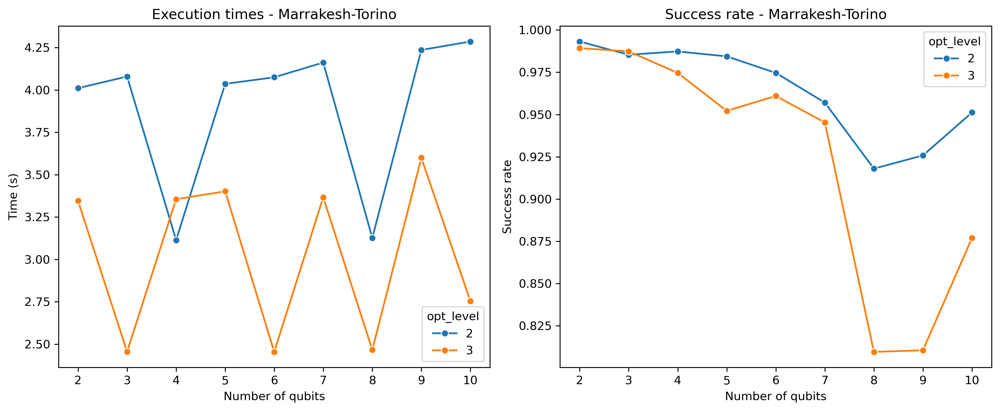

In [ ]:
df_torino_marrakesh = pd.concat([
    df_133q_wth_opt_3,
    df_156q_wth_opt_2
])

graficar_backend(df_torino_marrakesh, "Marrakesh-Torino")

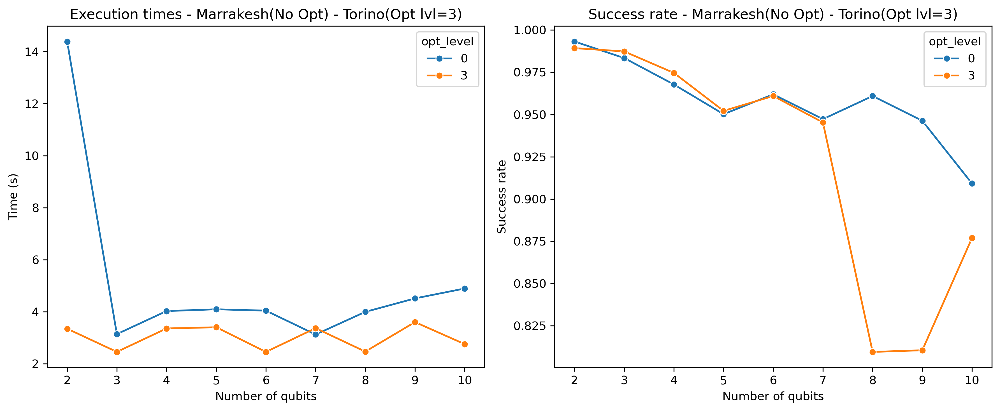

In [ ]:
df_torino_marrakesh = pd.concat([
    df_133q_wth_opt_3,
    df_156q_wthout_opt
])

graficar_backend(df_torino_marrakesh, "Marrakesh(No Opt) - Torino(Opt lvl=3)")

Even the Marrakesh fake provider without optimization has better performance than the Torino fake provider with the higger optimization level, making clear the benefits in this case of larger and newer fake backends.

### **Why I benchmark qiskit simulator too?**

Despite, the constant 100% of success rate in the Qiskit simulators due to the non-existence of noise and error- I didn't choose the option of simulate noise because later I was going to benchamark the fake backends and I found it unnecesary- benchmark the simulator it´s also a wonderfull options because sometimes you dont want to work to noise and its important to know the limits of each simulator and taken it into consideration. In this cases, you are executing your circuit in a perfect enviroument where the quantum gates are applied without errors, decoherence doesn't exist, there is no error in the measurement and the topology doesn't matter. Thus, the result is always exacrly as the theoretical prediction. There is specific situations where you only want to check if the logic of your circuit is correct or even understand the quantum algorithim in a pure way.